<a href="https://colab.research.google.com/github/davidklhui/UoN/blob/main/MATH4021_Dissertation_code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install csaps    # for cubic smoothing spline, version 1.1.0


In [ ]:
import numpy as np # version 1.22.4
import pandas as pd #version 1.5.3
import math
import matplotlib.pyplot as plt


plt.ioff()

# Section 1: Define basic functions



## 1.1 L2-norm

Euclidean Norm. Simply use numpy built-in method **np.linalg.norm()**

In [ ]:
# test
a = np.array([1,2])

print(f'Using np Build-in: {np.linalg.norm(a)}')
print(f'Using direct calculation: {np.sqrt(sum(a**2))}')

Using np Build-in: 2.23606797749979
Using direct calculation: 2.23606797749979


## 1.2 Geodesic Distance

calculate the distance between point_from and point_to on $S^2$


In [ ]:
def geodesic_distance(point_from, point_to):
  """
  Calculate the distance between 2 points on S^2

  :point_from: accept 3d np array [x,y,z]
  :point_to: accept 3d np array [x,y,z]
  """
  if round(np.linalg.norm(point_from), 8) != 1:
    print(f'point_to={point_from}, with norm={np.linalg.norm(point_from)}')
    raise Exception("the given point_from is not norm 1")
  if round(np.linalg.norm(point_to), 8) != 1:
    print(f'point_to={point_to}, with norm={np.linalg.norm(point_to)}')
    raise Exception("the given point_to is not norm 1")

  dotproduct = np.dot(point_from, point_to)
  if np.abs(dotproduct) >= 1:
    return 0
  else:
    return np.arccos(dotproduct)


In [ ]:
# test, let p0 = (0,0,1), p1 = (1,0,0),
# then the geodesic distance between them is the arc-length between them,
# which is clearly 1/4 or the perimeter of the great circle

p0 = np.array([0,0,1])
p1 = np.array([1,0,0])

print(f'Geodesic distance between p0 and p1 = {geodesic_distance(p0, p1)}')
print(f'0.25 * perimeter = {0.25 * 2 * math.pi * 1}')

Geodesic distance between p0 and p1 = 1.5707963267948966
0.25 * perimeter = 1.5707963267948966


## 1.3 Initial Velocity

The initial velocity to move from point_from to point_to along the piecewise geodesic (just reserved the direction, so the norm is 1)

In [ ]:
def velocity(point_from, point_to):
  """
  Calculate the initial velocity to move from point_from to point_to along the piecewise geodesic
  Here it just "reserved" the direction, so the norm is 1

  :point_from: accept 3d array [x,y,z]
  :point_to: accept 3d array [x,y,z]
  """

  p0 = point_from
  p1 = point_to

  # unit direction
  t = geodesic_distance(p0, p1)
  direction = (p1 - p0 * np.cos(t)) / np.sin(t)


  return (direction)



In [ ]:
# test, suppose moving from (0,0,1) to (1,0,0), then the initial velocity (direction) is clearly horizontal heading to (1,0,0)
p0 = np.array([0,0,1])
p1 = np.array([1,0,0])

print(f'velocity = {velocity(p0, p1)}')



velocity = [ 1.000000e+00  0.000000e+00 -6.123234e-17]


## 1.4 Geodesic intersection angle

Calculate the between 2 geodesic curves at the point of intersection

Suppose $g_{i,j}$ and $g_{j,k}$ be 2 piecewise geodesic curves intersect at $p_j$, then use the initial velocity of $v_{j,i}$ and $v_{j_k}$ to define the angle via dot product


In [ ]:
def geodesic_intersection_angle(point_of_intersection, point1, point2):
  """
  Calculate the between 2 geodesic curves at the point of intersection

  Suppose  𝑔𝑖,𝑗  and  𝑔𝑗,𝑘  be 2 piecewise geodesic curves intersect at  𝑝𝑗,
  then use the initial velocity of  𝑣𝑗,𝑖  and  𝑣𝑗𝑘  to define the angle via dot product

  all 3 points are 3d np array
  """

  p0 = point_of_intersection
  p1 = point1
  p2 = point2

  v01 = velocity(point_of_intersection, p1)
  v01 = v01 / np.linalg.norm(v01)

  v02 = velocity(point_of_intersection, p2)
  v02 = v02 / np.linalg.norm(v02)

  dotproduct = round(np.dot(v01, v02), 10) # add a rounding here to avoid arccos +-1 error due to floating point error

  return np.arccos(dotproduct)


In [ ]:
# test
# suppose 3 points: from (-1/sqrt(2), -1/sqrt(2), 0) -> (0,0,1) -> (1/sqrt(2), -1/sqrt(2), 0), which should give pi/2

p0 = np.array([-1, -1, 0]) / np.sqrt(2)
p1 = np.array([0,0,1])
p2 = np.array([1, -1, 0]) / np.sqrt(2)

print(f'geodesic angle of intersection = {geodesic_intersection_angle(p1, p0, p2)}')
print(math.pi / 2)


# test2
# suppose 3 points: from (0,-1,0) -> (0,0,1) -> (1,0,0), which should also give pi/2
p0 = np.array([0, -1, 0])
p1 = np.array([0,0,1])
p2 = np.array([1, 0, 0])

print(f'geodesic angle of intersection = {geodesic_intersection_angle(p1, p0, p2)}')
print(math.pi / 2)


# test3
# suppose 3 points: from (0,-1,0) -> (0,0,1) -> (1/sqrt(2), -1/sqrt(2), 0), which should give pi/4
p0 = np.array([0, -1, 0])
p1 = np.array([0,0,1])
p2 = np.array([1, -1, 0]) / np.sqrt(2)

print(f'geodesic angle of intersection = {geodesic_intersection_angle(p1, p0, p2)}')
print(math.pi / 4)


geodesic angle of intersection = 1.5707963267948966
1.5707963267948966
geodesic angle of intersection = 1.5707963267948966
1.5707963267948966
geodesic angle of intersection = 0.7853981633784236
0.7853981633974483


## 1.5 Constant Speed piecewise geodesic

define
dd = geodesic distance between $p_i$ and $p_j$
tt = if presence, be the time taken to move from $p_i$ to $p_j$; else tt = dd

then the parameteric curve at t from 0 to tt is $g_{i,j}(t)$ = $p_i$ * cos(t * dd/tt) + $v_{i,j}$ * sin(t * dd/tt)

In [ ]:
def constant_speed_piecewise_geodesic(point_from, point_to = None, t = None, time_taken = None, initial_velocity = None):
  """
  define
  dd = geodesic distance between $p_i$ and $p_j$
  tt = if presence, be the time taken to move from $p_i$ to $p_j$; else tt = dd

  then the parameteric curve at t from 0 to tt is $g_{i,j}(t)$ = $p_i$ * cos(t * dd/tt) + $v_{i,j}$ * sin(t * dd/tt)

  points accept 3d np array [x,y,z]
  """

  p0 = point_from
  p1 = point_to
  v = initial_velocity
  tt = time_taken

  if p1 is not None:
    if v is None:
      v = velocity(p0, p1)
  else:
    # case if p1 is None
    if v is None:
      raise Exception("cannoth both point_to and initial_velocity are None")
    else:
      # in this case, should expect tt is not None
      # velocity is presence, but p1 is None
      # expect that v is norm-1 (because just reserve direction)
      v = v/np.linalg.norm(v)

      p1 = p0 * np.cos(tt) + v * np.sin(tt)
      print(f"p1={p1}, norm={np.linalg.norm(p1)}")

  dd = geodesic_distance(p0, p1)

  if tt is None:
    # if not given the time taken, just treat it unit speed geodesic
    tt = dd

  if t is None:
    t = tt

  return p0 * np.cos(t * dd/tt) + v * np.sin(t * dd/tt)


In [ ]:
# test
p0 = np.array([0,0,1])
p1 = np.array([1,0,0])


# without given the time component, it just return the end point
print(f'eg1: {constant_speed_piecewise_geodesic(point_from = p0, point_to = p1, time_taken = 5)}')

# pass t = 0 will return the starting point
print(f'eg2: {constant_speed_piecewise_geodesic(point_from = p0, point_to = p1, time_taken = 5, t = 0)}')

# pass any t between 0 and time_taken,
print(f'eg3: {constant_speed_piecewise_geodesic(point_from = p0, point_to = p1, time_taken = 5, t = 3)}')

# for above simple example, because the curve connecting p0 and p1 is 1/4 perimeter
# and total time taken is 5, so simply we can calculate the "ratio" to find the position at t=3
# moved angle = pi/4 * 3/5, so new position is (sin(angle), 0, cos(angle))
angle = math.pi / 2 * 3 / 5
print(f'{np.sin(angle), 0, np.cos(angle)}')





eg1: [1. 0. 0.]
eg2: [0. 0. 1.]
eg3: [0.80901699 0.         0.58778525]
(0.8090169943749475, 0, 0.5877852522924731)


## 1.6 Position at time t

Given an array of position in different time point, first joining those using constant speed geodesic curves (each consecutive curve may have different speed), and finally find the position at t

In [ ]:
def position_geodesic_t(t, data):
  """
  Given the data (all trace at consecutive time point), find the position at time t

  :t: time t
  :data: n x 4 array, for each row should have structure [t,x,y,z]
  """
  if t<0:
    raise Exception("t cannot less than 0")
  if t > max(data[:,0]):
    raise Exception("t cannot greater than the largest defined time point")

  index = np.where(data[:,0]==t)[0]
  if index.size==1:
    return data[index,:][0]
  else:
    latest_index = max(np.where(data[:,0]<t)[0])
#    print(latest_index)
    latest_data = data[latest_index, :]
    next_data = data[latest_index+1, :]

#    print(latest_data)
#    print(next_data)
    latest_time = latest_data[0]
    latest_point = latest_data[1:]
    next_time = next_data[0]
    next_point = next_data[1:]

#    print(f'latest point = {latest_point}')
#    print(f'next point = {next_point}')

    time_taken = next_time - latest_time
    exceeded_time = t - latest_time

#    print(f'time taken = {time_taken}')
#    print(f'exceeded_time = {exceeded_time}')

    gt = constant_speed_piecewise_geodesic(point_from = latest_point,
                                           point_to = next_point,
                                           t = exceeded_time,
                                           time_taken = time_taken)


    gt2 = np.concatenate((np.array([t]), gt), axis=0) # append time to reconstruct [t,x,y,z] structure

    return gt2



In [ ]:
# test
# first prepare a dataset, this test dataset is a 4*4 np.array,
# for each row it has [t, x, y, z] component
# t must be starts with 0, increasing, but not necessarily consecutive integers (note here the time points are 0, 1, 3.2, 4)
# the rest [x,y,z] comoponents must be norm=1 to fulfil condition (point on sphere)
data = np.array([[0,1,1,1]/np.sqrt(3),
                  [1*np.sqrt(9),2,1,2]/np.sqrt(9),
                [3.2*np.sqrt(14),1,2,3] / np.sqrt(14),
                 [4*np.sqrt(14),3,2,1]/ np.sqrt(14)])

print(data)

print(f'at t=0: {position_geodesic_t(0, data)}')
print(data[0,:])

print("====")
print(f'at t=1: {position_geodesic_t(1, data)}')
print(data[1,:])

print("====")
print(f'at t=2.1 (which is not predefined time point, but the midway from 1 to 3.2 along the geodesic)')
print(f'at t=2.1: {position_geodesic_t(2.1, data)}')

[[0.         0.57735027 0.57735027 0.57735027]
 [1.         0.66666667 0.33333333 0.66666667]
 [3.2        0.26726124 0.53452248 0.80178373]
 [4.         0.80178373 0.53452248 0.26726124]]
at t=0: [0.         0.57735027 0.57735027 0.57735027]
[0.         0.57735027 0.57735027 0.57735027]
====
at t=1: [1.         0.66666667 0.33333333 0.66666667]
[1.         0.66666667 0.33333333 0.66666667]
====
at t=2.1 (which is not predefined time point, but the midway from 1 to 3.2 along the geodesic)
at t=2.1: [2.1        0.48025006 0.44627407 0.75511545]


## 1.7 Exponential Map

the mapping of tangent from the tangent plane (at the defined contact point) to the sphere

In [ ]:
def exponential_map(contact_point, vector_on_tangent_plane):

  """
  The mapping of tangent from the tangent plane to the sphere
  To prevent rounding error, will divide the L2-norm again
  """

  p = contact_point
  v = vector_on_tangent_plane

  if round(np.linalg.norm(v), 8) == 0:
    return p

  else:
    nv = np.linalg.norm(v)
    result = p * np.cos(nv) + (v/nv) * np.sin(nv)

    return result / np.linalg.norm(result)


## 1.8 Inverse Exponential Map

The mapping of point on the sphere to the tangent plane (at defined contact point)

In [ ]:
def inverse_exponential_map(contact_point, point_on_sphere):
  """
  return the tangent vector on the tangent plane [x,y,z]
  """
  p = contact_point
  p2 = point_on_sphere

  if round(np.linalg.norm(contact_point-point_on_sphere), 8)==0:
    return np.array([0,0,0])
  else:
    v = velocity(p, p2) * geodesic_distance(p, p2)

    return v


In [ ]:
# test exponential map and inverse exponential map
p0 = np.array([0,0,1])
p1 = np.array([1,1,0]) / np.sqrt(2)

print(f'tangent vector: {inverse_exponential_map(p0, p1)}')
print(f'map it back to the sphere: {exponential_map(p0, inverse_exponential_map(p0, p1))}') # this will get back the point p1

print("======")
v01 = np.array([1.2,2.5, 0])
print(f'map the tangent vector from the plane to sphere: {exponential_map(p0, v01)}')
print(f'map back to the tangent plane: {inverse_exponential_map(p0, exponential_map(p0, v01))}')
# this will get back the original vector (if the tangent vector length is reasonable,
# because the exponential map/inverse exp map only valid if the mapping is "reasonably" closed to the contact point)

tangent vector: [ 1.11072073e+00  1.11072073e+00 -9.61835347e-17]
map it back to the sphere: [0.70710678 0.70710678 0.        ]
map the tangent vector from the plane to sphere: [ 0.15588001  0.32475001 -0.93286594]
map back to the tangent plane: [1.2 2.5 0. ]


## 1.9 Simulate Point on Sphere

Simulate point on Sphere (satisfying norm=1)

In [ ]:
def sim_3d_sphere_point():
  """
  Using usual parameterization (u,v) -> (x,y,z)
  x = sin(u) cos(v)
  y = sin(u) sin(v)
  z = cos(u)
  """

  u = np.random.uniform(0, math.pi)
  v = np.random.uniform(0, 2*math.pi)

  x = np.sin(u) * np.cos(v)
  y = np.sin(u) * np.sin(v)
  z = np.cos(u)

  return np.array([x,y,z])



In [ ]:
# test
p1 = sim_3d_sphere_point()

print(f'point = {p1}, norm={np.linalg.norm(p1)}')

point = [0.64929218 0.22461542 0.72661378], norm=0.9999999999999999


## 1.10 Simulate Time series of points on Sphere

simulate correlated points on the sphere, for consecutive (equal spaced) time


In [ ]:
def timeseries_3d_sphere(t0=0, tn=10, dt=1, point_from=None):

  """
  if not given point_from, then directly chosen at the north pole
  :t0: time from (inclusive)
  :tn: time to (inclusive)
  :dt: time step (typically 1 or .5)
  :point_from: the starting point, need to satisfied norm=1
  """

  p0 = point_from
  len = int((tn-t0) / dt + 1)
  time_seq = np.linspace(t0, tn, len)
#  print(time_seq)

  if p0 is None:
    p0 = np.array([0,0,1])

  d0 = np.append([t0], p0, axis=0)

  data_cur = p0

  data = np.array([d0])
#  print(data)
  for i in range(1, len):
#    print(data_cur)
    ti = time_seq[i]

    # I choose to define the way to move using normal distribution, but there are many different
    # ways to simulate the random movement especially we can directly use sphere-valued distribution
    data_cur = data_cur + [np.random.normal(0.2, 0.1),
                           np.random.normal(0.3, 0.1),
                           np.random.normal(0.05, 0.025)]
#    data_cur = data_cur + np.random.normal(0.25, 0.75, size=3)

    data_cur = data_cur / np.linalg.norm(data_cur)

    d1 = np.append([ti], data_cur)
#    print(d1)

    data = np.vstack((data, d1))

#  print(data.shape)

  return data









In [ ]:
# test

data = timeseries_3d_sphere()
print(data)

print(f'position at t=5: {position_geodesic_t(t=5, data=data)}')
print(f'position at t=5.5: {position_geodesic_t(t=5.5, data=data)}')
print(f'position at t=0: {position_geodesic_t(t=0, data=data)}')

[[ 0.          0.          0.          1.        ]
 [ 1.          0.16694871  0.26816636  0.94879657]
 [ 2.          0.18800893  0.3895666   0.90160441]
 [ 3.          0.34695166  0.52226222  0.77901651]
 [ 4.          0.39157293  0.69942013  0.59789808]
 [ 5.          0.40178221  0.77260158  0.49158708]
 [ 6.          0.39361748  0.84231561  0.36819789]
 [ 7.          0.52957942  0.79563348  0.29413093]
 [ 8.          0.61830505  0.72806401  0.29600956]
 [ 9.          0.52907133  0.80160806  0.27840266]
 [10.          0.60819864  0.75075424  0.25780318]]
position at t=5: [5.         0.40178221 0.77260158 0.49158708]
position at t=5.5: [5.5        0.39870543 0.80950026 0.43097947]
position at t=0: [0. 0. 0. 1.]


## 1.11 Vector distance on tangent plane

Simply to usual Euclidean distance, as each vector on the tangent plane must be starts at (0,0), so the vector distance between 2 "tangent" is the euclidean distance of w0 and w1


In [ ]:
def vector_distance(point1, point2):
  return np.linalg.norm(point1-point2)

## 1.12 Vector intersection angle

Simply calculate the uaual angle between 2 vectors




In [ ]:
def vector_intersection_angle(point_of_intersection, point1, point2):

  w01 = point1 - point_of_intersection
  w01 = w01 / np.linalg.norm(w01)

  w02 = point2 - point_of_intersection
  w02 = w02 / np.linalg.norm(w02)

  dotproduct = np.dot(w01, w02)

  return np.arccos(round(dotproduct, 10)) # perform rounding in order to avoid rounding error that makes the dotproduct >1 or <-1






In [ ]:
# test
# simple case, simple 3,4,5 right-angle triangle
w1 = np.array([0,3])
w2 = np.array([4,0])

print(f'vector distance = {vector_distance(w1, w2)}')
print(f'vector angle of intersection = {vector_intersection_angle(np.array([0,0]), w1, w2)}')

print(math.pi / 2)

vector distance = 5.0
vector angle of intersection = 1.5707963267948966
1.5707963267948966


## 1.13 (U,V) -> (X,Y,Z) mapping

In [ ]:
def uv_2_xyz(u, v):
  """
  accept u from 0 to pi, v from 0 to 2pi
  return [x,y,z] spherical coordinates
  """

  return np.array([np.sin(u)* np.cos(v),
                   np.sin(u) * np.sin(v),
                   np.cos(u)])

## 1.14 (X,Y,Z) -> (U,V) mapping

In [ ]:
## (X,Y,Z) -> (U,V) mapping

def xyz_2_uv(x,y,z):
  """
  accept x,y,z such that norm of [x,y,z] is 1
  return [u,v] local parameterization
  """

  if round(np.linalg.norm(np.array([x,y,z])),8) != 1 :
    raise Exception(f"norm if [x,y,z] is not 1, this norm of {x,y,z} is : {np.linalg.norm(np.array([x,y,z]))}")

  u = np.arccos(z)

  if x==0:
    v = 0
  else:
    # x = sin(u)cos(v), y = sin(u)sin(v), z = cos(u)
    v = np.arctan(y/x)


  return np.array([u,v])




In [ ]:
x = np.array([0,0,1])
x1 = np.array([1/2,np.sqrt(3/4),0])
x2 = np.array([1/2,-1*np.sqrt(3/4),0])

v1 = inverse_exponential_map(x, x1)
v2 = inverse_exponential_map(x, x2)

v = (v1+v2)/2
xx = exponential_map(x,v)

uv1 = xyz_2_uv(x1[0], x1[1], x1[2])
uv2 = xyz_2_uv(x2[0], x1[1], x1[2])
uv = (uv1+uv2)/2
xxx = uv_2_xyz(uv[0], uv[1])

print(v)
print(xx)

print(uv)
print(xxx)

[ 7.85398163e-01  0.00000000e+00 -9.61835347e-17]
[0.70710678 0.         0.70710678]
[1.57079633 1.04719755]
[5.00000000e-01 8.66025404e-01 6.12323400e-17]


## 1.15 Parallel Transport

Parallel Transport defines how to "move" a vector on the sphere in a "parallel" way




In [ ]:
def parallel_transport(transport_tangent, point_from, point_to, time_taken = None, t = None):
  """
  :transport_tangent: the tangent vector on the sphere that needed to be transport
  :point_from: from point
  :point_to: to point
  :time_taken: the total time taken to transport the tangent vector from point_from to point_to
  :t: between 0 to time_taken, finding the tangent vector at time t along the geodesic curve at time t
  """

  w = transport_tangent
  p0 = point_from
  p1 = point_to

  tt = time_taken


  if tt is None:
    # if not given time taken is this case, just treat it unit speed
    tt = geodesic_distance(p0, p1)

  if t is None:
    t = time_taken


  g = constant_speed_piecewise_geodesic(p0, p1, t, time_taken = tt)
  dd = geodesic_distance(p0, p1)

  v = velocity(p0, p1)

  dotproduct = np.dot(w, v)

  v0 = v * dd/tt #scale the velocity

  dgdt = (dd/tt) * (-1 * p0 * np.sin(t * dd/tt) + v * np.cos(t * dd/tt))

  wt = w - dotproduct * (v0 - dgdt) * tt/dd

  return wt


In [ ]:
# test
# intuitively, originally the tangent is pointing the "east" of equator horizontally, so after transport to the "east", the vector becomes pointing downward
# also note that the length (norm) must be preserved after transportation
w = np.array([5,5,0])
p0 = np.array([0,0,1])
p1 = np.array([1,0,0])
tt = 10

print(f'before transport, vector norm={np.linalg.norm(w)}')

w1=parallel_transport(w, p0, p1, tt)

print(f'after transport, vector norm={np.linalg.norm(w1)}')
print(w1)




before transport, vector norm=7.0710678118654755
after transport, vector norm=7.0710678118654755
[ 0.  5. -5.]


# Section 2: Define functions for Unrolling, Unwrapping and Wrapping

## 2.1 Unrolling

Unrolling along all piecewise geodesic, currently only define when the starting point is the North pole



In [ ]:
def unrolling(data):
  """
  accept ndarray with shape (n,4)
  """

  # paths on tangent plane, starts at (0,0,0)
  # for the unrolling process at the north pole, the z-coordinates of the tangent must be 0
  paths_tp = np.array([0,0,0])
  t = max(data[:,0])

  if data.shape[0]==1:
    return paths_tp

  for i in range(0,data.shape[0]-1):
    p0 = data[i, 1:]
    p1 = data[i+1, 1:]

    j = i
    w = inverse_exponential_map(p0, p1)
#    print(f'before transport: {w}')
    while j > 0:
      w = parallel_transport(transport_tangent = w,
                             point_from = data[j, 1:],
                             point_to = data[j-1, 1:],
                             time_taken = np.abs(data[i, 0] - data[j-1, 0]))

      j = j-1
#    print(f'after transport: {w}')

    if i==0:
      paths_tp = np.vstack([paths_tp, w])
    else:
      paths_tp = np.vstack([paths_tp, paths_tp[i,] + w])

  paths_tp = np.c_[data[:,0], paths_tp]

  return paths_tp



In [ ]:
# test
# the simulated data
data = timeseries_3d_sphere()
print(data)

print("======")
# unrolling
ur = unrolling(data)
print(ur)

[[ 0.          0.          0.          1.        ]
 [ 1.          0.11274942  0.26153949  0.95858472]
 [ 2.          0.27724693  0.4471889   0.85038593]
 [ 3.          0.41893937  0.54437323  0.72673763]
 [ 4.          0.49639728  0.67661146  0.54386274]
 [ 5.          0.52150673  0.73545343  0.43259563]
 [ 6.          0.4909461   0.81025879  0.3200822 ]
 [ 7.          0.59344479  0.77309846  0.22392421]
 [ 8.          0.5847585   0.78213321  0.21523276]
 [ 9.          0.56645032  0.79507171  0.21678333]
 [10.          0.57713381  0.78374415  0.22948131]]
[[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 1.00000000e+00  1.14332185e-01  2.65210958e-01  0.00000000e+00]
 [ 2.00000000e+00  2.89307112e-01  4.72737382e-01 -1.38777878e-17]
 [ 3.00000000e+00  4.52541192e-01  6.08138336e-01 -1.24900090e-16]
 [ 4.00000000e+00  5.75978167e-01  8.12992842e-01 -5.55111512e-17]
 [ 5.00000000e+00  6.36987673e-01  9.26013795e-01  4.16333634e-17]
 [ 6.00000000e+00  6.48740883e-01  1

In [ ]:
import plotly.graph_objects as go

layout = go.Layout(width = 1000, height =1000,
                             title_text='Sphere')

u = np.linspace(0, np.pi, 100)
v = np.linspace(0, 2 * np.pi, 100)

x = np.outer(np.sin(u), np.cos(v))
y = np.outer(np.sin(u), np.sin(v))
z = np.outer(np.cos(u), np.ones_like(v))

# Create a 3D surface plot
fig = go.Figure(data=[go.Surface(x=x, y=y, z=z)], layout=layout)

traces = []
for i in range(0, data.shape[0]-1):
  d0 = data[i,]
  d1 = data[i+1,]

  p0 = d0[1:]
  p1 = d1[1:]
  tt = np.abs(d0[0]-d1[0])

#  print(p0)
#  print(p1)
#  print("===")
  traces = None
  for t in np.linspace(0, tt, 50):
    gt = constant_speed_piecewise_geodesic(p0, p1, t=t, time_taken=tt)
#    print(gt)
    if traces is None:
      traces = gt
    else:
      traces = np.vstack([traces, gt])

X = traces[:,0]
Y = traces[:,1]
Z = traces[:,2]

fig.add_trace(go.Scatter3d(
    x=X.flatten(),
    y=Y.flatten(),
    z = Z.flatten(),
    mode='markers+lines',
    marker=dict(size=2, color="red"),
    line=dict(color="black", width=2)))


# Show the plot
fig.show()

### 2.1.1 Unrolling (up to specific time t)



In [ ]:
def unrolling_to_t(data, t):
  """
  accept ndarray with shape (n,4)
  """
  unrolled_coordinates = unrolling(data)

  # check time exact match
  find_t = np.where(unrolled_coordinates[:,0]==t)[0]
  if find_t.size==1:
 #   print(f"found t={t}")
    return unrolled_coordinates[find_t[0],]

  # if not found exact match
#  print(t)
  find_latest_t = np.where(unrolled_coordinates[:,0]<t)[0]

  latest_t_index = find_latest_t[-1]
  next_t_index = latest_t_index + 1

  latest_data = unrolled_coordinates[latest_t_index, ]
  next_data = unrolled_coordinates[next_t_index, ]

  latest_time = latest_data[0]
  next_time = next_data[0]

  latest_point = latest_data[1:]
  next_point = next_data[1:]

  # performing linear interpolation
  point_at_time_t = latest_point + (t - latest_time) / (next_time - latest_time) * (next_point - latest_point)

  coord_at_time_t = np.hstack([t, point_at_time_t])

  return coord_at_time_t




In [ ]:
print(unrolling(data))
print("===")

print(unrolling_to_t(data, 2.5))

print("===")
print(f'at t=2: {unrolling_to_t(data, 2)}')
print(f'at t=3: {unrolling_to_t(data, 3)}')
print((unrolling_to_t(data,2) + unrolling_to_t(data,3))/2)

[[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 1.00000000e+00  1.14332185e-01  2.65210958e-01  0.00000000e+00]
 [ 2.00000000e+00  2.89307112e-01  4.72737382e-01 -1.38777878e-17]
 [ 3.00000000e+00  4.52541192e-01  6.08138336e-01 -1.24900090e-16]
 [ 4.00000000e+00  5.75978167e-01  8.12992842e-01 -5.55111512e-17]
 [ 5.00000000e+00  6.36987673e-01  9.26013795e-01  4.16333634e-17]
 [ 6.00000000e+00  6.48740883e-01  1.06415029e+00  2.77555756e-17]
 [ 7.00000000e+00  7.92199317e-01  1.08844499e+00 -1.56125113e-16]
 [ 8.00000000e+00  7.87046379e-01  1.10280017e+00 -9.54097912e-18]
 [ 9.00000000e+00  7.67631755e-01  1.11411795e+00 -6.41847686e-17]
 [ 1.00000000e+01  7.72945319e-01  1.09474092e+00 -4.77048956e-17]]
===
[ 2.50000000e+00  3.70924152e-01  5.40437859e-01 -6.93889390e-17]
===
at t=2: [ 2.00000000e+00  2.89307112e-01  4.72737382e-01 -1.38777878e-17]
at t=3: [ 3.00000000e+00  4.52541192e-01  6.08138336e-01 -1.24900090e-16]
[ 2.50000000e+00  3.70924152e-01  5.4043

## 2.2 Unwrapping

suppose there are points on the sphere. then this method "project" these points along the unrolled path, to the tangent plane

In [ ]:
def unwrapping_(data, t, point_on_sphere):
  """
  code for single time single point usage
  for more generic usage, need to use unwrapping(...)

  :data: ndarray with shape (n,4)
  :t: number between 0 and max(data[:,0]) inclusively
  :point_on_sphere: 1d array with structure [x,y,z]

  return 1d array [t,x,y,z]
  """
  p = point_on_sphere

  if t==0:
#    w = inverse_exponential_map(data[0,1:], p)
#    return np.hstack([t, w])
    return np.array([0,0,0,0])


  # then check if t is defined or data or not
  # if yes -> use unrolling; else -> use unrolling_to_t
  if np.where(data[:,0]==t)[0].size>=1:

    # found matching t
    index_at_t = np.where(data[:,0]==t)[0][-1]
    exceeded_time = t - data[index_at_t, 0]

    pos_at_t = position_geodesic_t(t, data)[1:]

    # find the tangent vector to be transported
    w = inverse_exponential_map(pos_at_t, p)

    j = index_at_t

  else:

    # not found matching, needed further parallel transport
    index_up_to_t = np.where(data[:,0]<t)[0][-1]
    exceeded_time = t - data[index_up_to_t, 0]

    pos_at_t = position_geodesic_t(t, data)[1:]

    # find the tangent vector to be transported
    w = inverse_exponential_map(pos_at_t, p)

    # extra parallel transport to position at t
    w = parallel_transport(transport_tangent=w,
                           point_from = pos_at_t,
                           point_to = data[index_up_to_t, 1:],
                           time_taken = abs(data[index_up_to_t, 0] - data[index_up_to_t+1,0]))

    # then parallel transport as before
    j = index_up_to_t


  while j>0:

    # performing parallel transport
      w = parallel_transport(transport_tangent=w,
                             point_from = data[j, 1:],
                             point_to = data[j-1, 1:],
                             time_taken = abs(data[j,0]-data[j-1,0]))

      j = j-1


  unrolled_up_to_t = unrolling_to_t(data, t)
  resulting_tangent_vector = np.hstack([t, unrolled_up_to_t[1:] + w])

  return resulting_tangent_vector


def unwrapping(data, unwrap_points_on_sphere=None, t=None, point_on_sphere=None):
  """
  :data: raw data for unrolling in structure for each row [t,x,y,z]
  :unwrap_points_on_sphere: data to be unrwap w.r.t. the unrolling base path, each row has structure [t,x,y,z]
  return nd array with shape (n,4)

  :t,point_on_sphere: for supply the same usage as in unwrapping(data,t,point_on_sphere), but result in 1d array

  """
  if unwrap_points_on_sphere is None:
    return unwrapping_(data, t, point_on_sphere)
  else:
    unrolled_points = unrolling(data)
    unwrapped_points = None
    for p in unwrap_points_on_sphere:
      uw = unwrapping_(data=data, t=p[0], point_on_sphere=p[1:])
      if unwrapped_points is None:
        unwrapped_points = uw
      else:
        unwrapped_points = np.vstack([unwrapped_points, uw])

    return unwrapped_points


In [ ]:
p = np.array([1,2,3])
p = p / np.linalg.norm(p)
print(p)
print(np.linalg.norm(p))
unwrapping(data, t=9, point_on_sphere=p)

[0.26726124 0.53452248 0.80178373]
1.0


array([9.00000000e+00, 2.82433911e-01, 5.78843613e-01, 2.68882139e-16])

## 2.3 Wrapping

Wrap the tangent vector from the tangent plane back to the sphere with respect to the unrolling path

In [ ]:
def wrapping_(data, t, vector_on_tangent_plane):
  """
  for a set of data to be wrapping, use wrapping(...)

  :vector_on_tangent_plane: accept [x,y,z] structure

  return 1d array [t,x,y,z]
  """

  w = vector_on_tangent_plane

  # t == 0
  if t==0:
    pos_at_t = data[0, 1:]
    p = exponential_map(pos_at_t, w)
    p = np.hstack([t, p])
    return p


  # t > 0
  w = vector_on_tangent_plane - unrolling_to_t(data, t)[1:]
  index_latest_t = np.where(data[:,0]<t)[0][-1]
  pos_at_t = position_geodesic_t(t, data)
#  print(vector_on_tangent_plane)
#  print(unrolling_to_t(data, t))
#  print(w)
#  if index_latest_t > 1:
  for j in range(0,(index_latest_t)):
    w = parallel_transport(transport_tangent=w,
                             point_from = data[j, 1:],
                             point_to = data[j+1, 1:],
                             time_taken = abs(data[j,0] - data[j+1,0]))

  # then determine next transport
  # if exact match t -> move to next time; else move to time t
  if np.where(data[:,0]==t)[0].size>=1:
    # means it found matched t
    w = parallel_transport(transport_tangent=w,
                           point_from = data[index_latest_t, 1:],
                           point_to = data[index_latest_t+1, 1:],
                           time_taken = np.abs(data[index_latest_t+1,0]-data[index_latest_t, 0]))
  else:
    # not matched t
    w = parallel_transport(transport_tangent=w,
                           point_from = data[index_latest_t, 1:],
                           point_to = pos_at_t[1:],
                           time_taken = abs(data[index_latest_t, 0]-data[index_latest_t+1,0]))


  resulting_point = exponential_map(pos_at_t[1:], w)
  resulting_point = np.hstack([t, resulting_point])

  return resulting_point


def wrapping(data, wrap_vectors_on_tangent_plane=None, t=None, vector_on_tangent_plane=None):
  """
  :data:the base path for unrolling, then as a base path for wrapping
  :warp_vectors_on_tangent_plane: accept nd array with each row in structure [t,x,y,z]

  return nd array with shape (n,4)

  to supply the same usage as wrapping_(data, t, vector_on_tangent_plane), if not supplying wrap_vectors_on_tangent_plane
  then return 1d array with structure [t,x,y,z]

  """
  if wrap_vectors_on_tangent_plane is None:
    return wrapping_(data, t, vector_on_tangent_plane)
  else:
    wrapped_tangents = None
    for vect in wrap_vectors_on_tangent_plane:
     new_p = wrapping_(data=data, t=vect[0], vector_on_tangent_plane=vect[1:])
     if wrapped_tangents is None:
       wrapped_tangents = new_p
     else:
       wrapped_tangents = np.vstack([wrapped_tangents, new_p])

    return wrapped_tangents


In [ ]:
wrapping(data, t=10, vector_on_tangent_plane=np.array([1,2,0]))

array([10.        ,  0.22189566,  0.77085104, -0.59711891])

# Section 3: Other helper functions

1.   Graph Plotting
2.   ...





## 3.1 Graph Plotting function

In [ ]:
import plotly.graph_objects as go

def add_traces(data, fig, col, label=None, lineWidth=2):

  # for each piecewise geodesic -> draw 10 inner-time for smoothness curve plotting
  traces = None
  for i in range(0, data.shape[0]-1):
    d0 = data[i,]
    d1 = data[i+1,]

    p0 = d0[1:]
    p1 = d1[1:]
    tt = np.abs(d0[0]-d1[0])

    for t in np.linspace(0, tt, 10):
      gt = constant_speed_piecewise_geodesic(p0, p1, t=t, time_taken=tt)
      if traces is None:
        traces = gt
      else:
        traces = np.vstack([traces, gt])


  X = traces[:,0]
  Y = traces[:,1]
  Z = traces[:,2]

  fig.add_trace(go.Scatter3d(
      x=X.flatten(),
      y=Y.flatten(),
      z = Z.flatten(),
      mode='markers+lines',
      marker=dict(size=2, color=col),
      line=dict(color=col, width=lineWidth), name=label))

  fig.update_coloraxes(showscale=False)
  return traces



def graph_plotting_3d(data, data_col="black", new_points=None, new_points_col = None, title_text='Sphere', col="black", label=None, lineWidth=2):
  """
  data should be in dimension n*4
  each row must have [t,x,y,z] structure
  time must be in ascending, and starts with 0
  """


  layout = go.Layout(width = 800, height =800,
                              title_text=title_text,
                     legend=dict(
                orientation="h"))

  u = np.linspace(0, np.pi, 100)
  v = np.linspace(0, 2 * np.pi, 100)

  x = np.outer(np.sin(u), np.cos(v))
  y = np.outer(np.sin(u), np.sin(v))
  z = np.outer(np.cos(u), np.ones_like(v))

  # Create a 3D surface plot
  fig = go.Figure(data=[go.Surface(x=x, y=y, z=z)], layout=layout)



  add_traces(data, fig, col=col, label=label, lineWidth=lineWidth)

  # Show the plot
  #fig.show()

  return fig

# Section 4: Demostrate perform different curves fitting method

This part will first set a new seed and declare data for the whole section.
Then demostrate different different types of curves fitting method in tangent plane and wrap back to the sphere

Methods:

Given true curve
1.    Cubic Smoothing Spline
2.    Gaussian Processes regression (Assumed independent x(t) and y(t) for all t)

Given sample trajectories
1.    Cubic Smoothing Spline
2.    Gaussian Processes Regression



### 4.1 Mean Square Error (on sphere, using geodesic distance)


In [ ]:
def mse_geodesic(raw_data, predicted_points_on_manifold):

  if raw_data.shape[0] != predicted_points_on_manifold.shape[0]:
    raise Exception("input dimensions are unequal")
  MSE = []
  for i in range(0, raw_data.shape[0]):
    error = geodesic_distance(raw_data[i,1:], predicted_points_on_manifold[i,1:]) # using Geodesic distance
    MSE = np.append(MSE, error)


#  print(MSE)
  MSE = np.mean(MSE**2)

  return MSE

## 4.2 Mean Square Error (on Tangent plane, using Euclidean distance)

Unrol according to the starting point, note that they are referring to different base **path**

In [ ]:
def mse_euclidean(raw_data, predicted_data_on_euclidean_space):

  if raw_data.shape[0] != predicted_data_on_euclidean_space.shape[0]:
    raise Exception("input dimensions are unequal")

  MSE = []
  for i in range(0, raw_data.shape[0]):
    error = np.linalg.norm(raw_data[i,1:]- predicted_data_on_euclidean_space[i,1:]) # using Euclidean distance
    MSE = np.append(MSE, error)


#  print(MSE)

  MSE = np.mean(MSE**2)

  return MSE



## 4.3 Analysis: Given true curve

Custom defined a way to get time-series of curve
and another function to get sample with a little randomness

Assume the true curve like

In [ ]:
def true_curve():
  """
  Suppose the true curve is staring at the North pole
  """

  us = np.arange(0,31) / 5 *np.pi/12
  vs = np.pi/6 * np.sin(6*us)

  path = np.empty(shape=(0,4))

  ts = np.arange(0, len(us))

  for t in ts:
    u = us[t]
    v = vs[t]
    xyz = uv_2_xyz(u,v)
    p = np.append(t, xyz)

    path = np.vstack((path, p))

  return path


In [ ]:
true_curve()



array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         1.00000000e+00],
       [ 1.00000000e+00,  5.16523839e-02,  8.43110612e-03,
         9.98629535e-01],
       [ 2.00000000e+00,  9.96170271e-02,  3.16646101e-02,
         9.94521895e-01],
       [ 3.00000000e+00,  1.42607999e-01,  6.43016367e-02,
         9.87688341e-01],
       [ 4.00000000e+00,  1.82661444e-01,  9.93079464e-02,
         9.78147601e-01],
       [ 5.00000000e+00,  2.24143868e-01,  1.29409523e-01,
         9.65925826e-01],
       [ 6.00000000e+00,  2.71487813e-01,  1.47600373e-01,
         9.51056516e-01],
       [ 7.00000000e+00,  3.26693585e-01,  1.47305427e-01,
         9.33580426e-01],
       [ 8.00000000e+00,  3.87625475e-01,  1.23211964e-01,
         9.13545458e-01],
       [ 9.00000000e+00,  4.48060822e-01,  7.31359921e-02,
         8.91006524e-01],
       [ 1.00000000e+01,  5.00000000e-01,  3.20611782e-17,
         8.66025404e-01],
       [ 1.10000000e+01,  5.37525376e-01, -8.77390962e-02,
      

In [ ]:
# see the local parameterization and the true curve
def plotter(further_traces=None):
  uv = np.array(list(map(
      lambda xyz: xyz_2_uv(xyz[1], xyz[2], xyz[3]),true_curve()
  )))
  # print(uv)

  plt.plot(uv[:,0], uv[:,1], color="black", linestyle='solid', marker='o')
  plt.xlabel("u")
  plt.ylabel("v")
  fig2 = graph_plotting_3d(data=true_curve(), data_col="black", label="True curve")

  if further_traces is not None:

    # up to 5
    Colors = ["red", "blue", "green", "yellow", "orange"]
    for i in range(np.minimum(5, further_traces.shape[0])):

      d = further_traces[i]

      uv1 = np.array(list(map(
        lambda xyz: xyz_2_uv(xyz[0], xyz[1], xyz[2]) , d[:, 1:]
      )))

      plt.plot(uv1[:,0], uv1[:,1], color=Colors[i], linestyle='solid', marker='o', label=f"Trace {i+1}")
      add_traces(d, fig2, col=Colors[i], label=f"Trace {i+1}")

  plt.legend()

  plt.show()
  fig2.show()



Generate sample curves

Suppose we have a true curve, and samples are generated from this curve but subject to some degree of randomness.

For all fitting methods, we will treat the true curve is fixed but unknown. And after that, we will use this "true curve" for addressing the prediction error

In [ ]:
def generate_sample_curves(true_path, n_samples=10, common_sd=None):
  n = n_samples
  output = list()

  for i in range(0,n):
    ts = true_path[0,]
    for t_index in range(1, true_path.shape[0]):
      t = true_path[t_index, 0]
      # add a small error onto the coordinates
      p = true_path[t_index, 1:]

      # normal random noise in all directions, better choice may use Spherical probability distribution, but for simplicity,
      # just add normal components and rescale to norm 1 (the drawback is this leads the error is no longer the same as the sd)
#      p = p + np.random.normal(0, 0.1, size=3)
#      print(f"t_index % 3 = {t_index} % 3 = {t_index%3}")
      uv = xyz_2_uv(p[0],p[1],p[2])

      if common_sd is None:
        if t_index % 3 ==1:
          uv = uv + np.random.normal(0, 0.005, size=2)
        if t_index % 3 ==2:
          uv = uv + np.random.normal(0, 0.05, size=2)
        if t_index % 3 ==0:
          uv = uv + np.random.normal(0, 0.1, size=2)
      else:
        uv = uv + np.random.normal(0, common_sd, size=2)

      p = uv_2_xyz(uv[0], uv[1])
      p = p / np.linalg.norm(p)   # prevent rounding error that makes the norm != 1

      ts = np.vstack([ts, np.hstack([t, p])])

    output.append(ts)

  return np.array(output)


def centroid_at_t_on_sphere(samples):
  """
  Because assumed common starting point at the North Pole
  for each t,
  first perform invserse exponential map at the staring point
  then perform usual Euclidean mean on both x and y coordinates
  finally perform expoential map back
  """

  times = samples[0,:,0]

  centroids = []

  point_from = np.array([0,0,1])

  for t_index in range(0, times.shape[0]):
    # get the data at time t
    t = times[t_index]
    sample_data_t = samples[:,t_index, 1:]
#    print(sample_data_t)
    point_on_tangent_plane = np.array(
        list(map(lambda x: inverse_exponential_map(point_from, x), list(sample_data_t))))
#    print(point_on_tangent_plane)
    px = np.mean(point_on_tangent_plane[:,0])
    py = np.mean(point_on_tangent_plane[:,1])

    point_on_sphere = exponential_map(point_from, np.array([px,py,0]))

    centroids.append(np.hstack([t, point_on_sphere]))

  return np.array(centroids)





In [ ]:
np.random.seed(1357)
#data = timeseries_3d_sphere(t0=0, tn=20, dt=1, point_from = np.array([0,0,1]))
data = generate_sample_curves(true_path=true_curve(), n_samples=2, common_sd=.05)

# print(data)
# print("===")
# ur = unrolling(data)
# print(ur)
# print("===")
# print(np.corrcoef(ur[:,1], ur[:,2]))




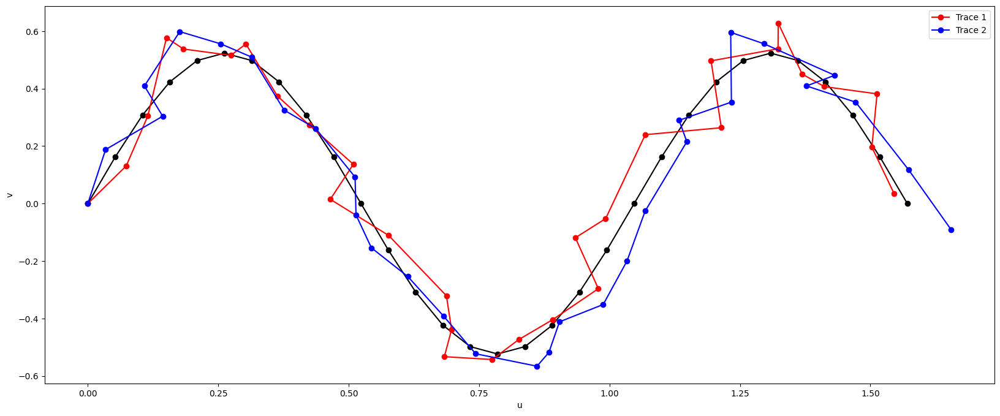

In [ ]:
# graph_plotting_3d(true_curve())
plotter(data)

In [ ]:
# raw data looks like this
fig = graph_plotting_3d(data[0,:], col="red")
add_traces(data[1,:], fig, col="blue")

fig.show()


### 4.3.1 Cubic Smoothing Spline

Cubic smoothing spline method in Unrolling, Unwrapping and Wrapping procedures involved the following steps:

1.  using the raw data, unrol to the tangent plane to the sphere at the starting point (Here is the North Pole)
2.  using the unrolled points on the tangent plane, fit a cubic smoothing spline
3.  predefine inter-time point G (e.g. 1 or 2) between consecutive times
4.  using the fitted curve, evaluated at those inter-time points, wrap back to the Sphere
5.  for each iteration, use the points on the sphere to construct piecewise geodesic, unrol it, called this base path. And then unwrap the raw data onto the tangent plane w.r.t. this base path, then fit cubic smoothing spline on these unrwapped points, find inter-time points, and finally wrap back. Iteration ends if the max geodesic distance between inter-time points smaller than tolerance

In [ ]:
def revise_times(data, G=1):
  """
  Using the given data, extract the first column (t)
  and then for each consecutive times, add inter-point according to the given argument G
  return 1d np array
  """
  timepoints = data[:,0]
  intertimes = []
  for t in range(0, timepoints.size-1):
    t0 = timepoints[t]
    t1 = timepoints[t+1]
    seq = np.linspace(t0, t1, G+2)
    intertimes = np.hstack([intertimes, seq])

  intertimes = np.unique(intertimes)

  return intertimes

In [ ]:
from csaps import csaps
from csaps import CubicSmoothingSpline

def fitting_cubic_smoothing_spline(data, G=1, tolerance = 1e-3, smoothness=.85):
  timepoints = data[:,0]
  revised_times = revise_times(data, G)

  unrolled_points = unrolling(data)   # t,x,y,z

#  print(unrolled_points)

  spline_x = CubicSmoothingSpline(timepoints, unrolled_points[:,1], smooth=smoothness)
  spline_y = CubicSmoothingSpline(timepoints, unrolled_points[:,2], smooth=smoothness)

  print(f"smooth param: x={spline_x.smooth}, y={spline_y.smooth}")

  predict_x = spline_x(revised_times)
  predict_y = spline_y(revised_times)


  plt.rcParams["figure.figsize"] = (20, 8)
  fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
  fig.suptitle('Tangent coordinates x(t) and y(t) vs t subplots (Initial Guess)')
  ax1.plot(unrolled_points[:,0], unrolled_points[:,1], color="black", linestyle="solid", label="Unroll base path (x)")
  ax1.plot(revised_times, predict_x, color="red", linestyle='--', marker='x', label="Predicted x")
  ax1.set_xlabel("time t")
  ax1.set_ylabel("x(t)")
  ax1.legend(fontsize=15)

  ax2.plot(unrolled_points[:,0], unrolled_points[:,2], color="black", linestyle="solid", label="Unroll base path (y)")
  ax2.plot(revised_times, predict_y, color="red", linestyle='--', marker='x', label="Predicted y")
  ax2.set_xlabel("time t")
  ax2.set_ylabel("y(t)")
  ax2.legend(fontsize=15)

  ax3.plot(unrolled_points[:,1], unrolled_points[:,2], color="black", linestyle="solid", label="Unroll base path (x,y)")
  ax3.plot(predict_x, predict_y, color="red", linestyle='--', marker='x', label="Predicted (x,y)")
  ax3.set_xlabel("x(t)")
  ax3.set_ylabel("y(t)")
  ax3.legend(fontsize=15)
  plt.show()


  # before wrapping, note that x(0) and y(0) may not 0
  # which may wrap back to different point on the sphere (but it should be the North Pole)
  # because of length/angle should be preserved, so I can perform simple translation for all points
  # x*(t) = x(t) - x(0); y*(t) = y(t) - y(0)
  predict_x_revised = predict_x - predict_x[0]
  predict_y_revised = predict_y - predict_y[0]

  # combining predict_x and predict_y
  predictions = np.column_stack((revised_times, predict_x_revised, predict_y_revised, np.zeros_like(revised_times)))

  # these new_points will be for iteration
  new_points = wrapping(data=data, wrap_vectors_on_tangent_plane=predictions)

#  print(new_points)
  N_trials = 1
  while True:
    unwrapped_points = unwrapping(new_points, data)
#    print(unwrapped_points)
    iter_spline_x = CubicSmoothingSpline(timepoints, unwrapped_points[:,1], smooth=smoothness)
    iter_spline_y = CubicSmoothingSpline(timepoints, unwrapped_points[:,2], smooth=smoothness)

    print(f"smooth param: x={iter_spline_x.smooth}, y={iter_spline_y.smooth}")

    iter_predict_x = iter_spline_x(revised_times)
    iter_predict_y = iter_spline_y(revised_times)

#    plt.rcParams["figure.figsize"] = (12, 4)
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
    fig.suptitle('Tangent coordinates x(t) and y(t) vs t subplots (Iter=' + str(N_trials) + ')')

    ax1.plot(unwrapped_points[:,0], unwrapped_points[:,1], marker="^", color="blue", label="Unwrapped points (x)")
    ax1.plot(unrolled_points[:,0], unrolled_points[:,1], color="black", linestyle="solid", label="Unroll base path (x)")
    ax1.plot(revised_times, iter_predict_x, color="red", linestyle='--', marker='x', label="Predicted x")
    ax1.set_xlabel("time t")
    ax1.set_ylabel("x(t)")
    ax1.legend(fontsize=15)

    ax2.plot(unwrapped_points[:,0], unwrapped_points[:,2], marker="^", color="blue", label="Unwrapped points (y)")
    ax2.plot(unrolled_points[:,0], unrolled_points[:,2], color="black", linestyle="solid", label="Unroll base path (y)")
    ax2.plot(revised_times, iter_predict_y, color="red", linestyle='--', marker='x', label="Predicted y")
    ax2.set_xlabel("time t")
    ax2.set_ylabel("y(t)")
    ax2.legend(fontsize=15)

    ax3.plot(unwrapped_points[:,1], unwrapped_points[:,2], marker="^", color="blue", label="Unwrapped points (x,y)")
    ax3.plot(unrolled_points[:,1], unrolled_points[:,2], color="black", linestyle="solid", label="Unroll base path (x,y)")
    ax3.plot(iter_predict_x, iter_predict_y, color="red", linestyle='--', marker='x', label="Predicted (x,y)")
    ax3.set_xlabel("x(t)")
    ax3.set_ylabel("y(t)")
    ax3.legend(fontsize=15)


    # ax1.plot(unwrapped_points[:,0], unwrapped_points[:,1], 'o-',
    #          unrolled_points[:,0], unrolled_points[:,1], 'x-',
    #        revised_times, iter_predict_x, '-')
    # ax1.set_xlabel("time t")
    # ax1.set_ylabel("x(t)")

    # ax2.plot(unwrapped_points[:,0], unwrapped_points[:,2], 'o-',
    #          unrolled_points[:,0], unrolled_points[:,2], 'x-',
    #        revised_times, iter_predict_y, '-')
    # ax2.set_xlabel("time t")
    # ax2.set_ylabel("y(t)")

    # ax3.plot(unwrapped_points[:,1], unwrapped_points[:,2], 'o-',
    #          unrolled_points[:,1], unrolled_points[:,2], 'x-',
    #     iter_predict_x, iter_predict_y, '-')

    plt.show()


    # before wrapping, note that x(0) and y(0) may not 0
    # which may wrap back to different point on the sphere (but it should be the North Pole)
    # because of length/angle should be preserved, so I can perform simple translation for all points
    # x*(t) = x(t) - x(0); y*(t) = y(t) - y(0)
    iter_predict_x_revised = iter_predict_x - iter_predict_x[0]
    iter_predict_y_revised = iter_predict_y - iter_predict_y[0]


   # combining predict_x and predict_y
    iter_predictions = np.column_stack((revised_times, iter_predict_x_revised, iter_predict_y_revised,
                                        np.zeros_like(revised_times)))

#    print(iter_predictions)
    # these new_points will be for iteration
    new_points2 = wrapping(data=new_points, wrap_vectors_on_tangent_plane=iter_predictions)
#    print(new_points2)
    diff = 0
    for i in range(0,new_points.shape[0]):
      diff = np.maximum(diff, geodesic_distance(new_points[i,1:], new_points2[i,1:]))

    print(diff)


    new_points = new_points2
#    print(new_points)
    N_trials = N_trials + 1

    if diff < tolerance:
      print(f"diff < tol, diff={diff}, tol={tolerance}")
      break
    if N_trials > 100:
      raise Exception("N traisl exceeded 100")

  return new_points



#### Example

smooth param: x=0.85, y=0.85


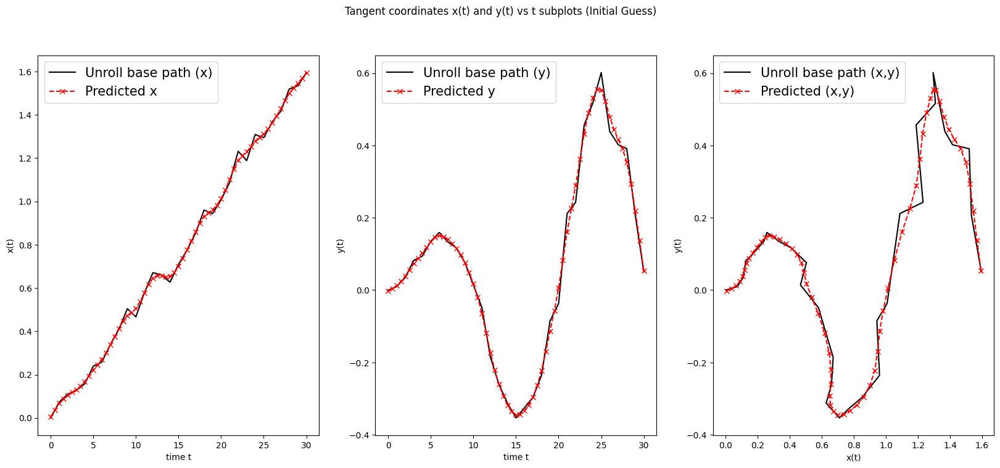

smooth param: x=0.85, y=0.85


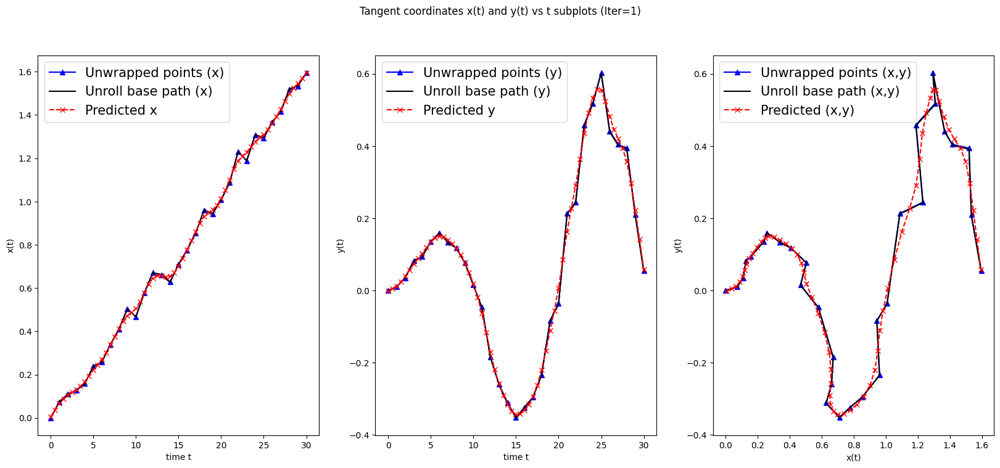

0.00010851330788130825
diff < tol, diff=0.00010851330788130825, tol=0.001


In [ ]:
# consider simlpe case
# One sample case
xx = fitting_cubic_smoothing_spline(data[0], G=1, tolerance=1e-3)
#np.savetxt("./foo.csv", data, delimiter=",")

In [ ]:
print(xx)
fig = graph_plotting_3d(data=true_curve(), label="True Curve")
add_traces(data=data[0], fig=fig, col="blue", label="Raw curve")
add_traces(data=xx, fig=fig, col="red", label="Fitted curve")

fig.show()

[[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]
 [ 5.00000000e-01  3.23590972e-02  6.57981117e-03  9.99454649e-01]
 [ 1.00000000e+00  6.11512990e-02  1.49114166e-02  9.98017118e-01]
 [ 1.50000000e+00  8.36341510e-02  2.64185074e-02  9.96146270e-01]
 [ 2.00000000e+00  1.00281692e-01  4.12001785e-02  9.94105692e-01]
 [ 2.50000000e+00  1.12858053e-01  5.85217629e-02  9.91886215e-01]
 [ 3.00000000e+00  1.25102692e-01  7.56479746e-02  9.89255629e-01]
 [ 3.50000000e+00  1.40750147e-01  9.03794923e-02  9.85911225e-01]
 [ 4.00000000e+00  1.61516261e-01  1.04646975e-01  9.81306022e-01]
 [ 4.50000000e+00  1.87401362e-01  1.20356896e-01  9.74882017e-01]
 [ 5.00000000e+00  2.13769513e-01  1.35320031e-01  9.67466322e-01]
 [ 5.50000000e+00  2.36938477e-01  1.46497858e-01  9.60415814e-01]
 [ 6.00000000e+00  2.61202973e-01  1.51245085e-01  9.53361385e-01]
 [ 6.50000000e+00  2.91217115e-01  1.47951616e-01  9.45147032e-01]
 [ 7.00000000e+00  3.25577567e-01  1.39048665e-01  9.35235113e

#### Prediction Error

##### on sphere

In [ ]:
predicted_points_on_manifold = xx[np.isin(xx[:,0],data[0][:,0])]

print(predicted_points_on_manifold)

MSE = mse_geodesic(raw_data = true_curve(), predicted_points_on_manifold=predicted_points_on_manifold)
print(MSE) # 0.0010106452124175051


[[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]
 [ 1.00000000e+00  6.11512990e-02  1.49114166e-02  9.98017118e-01]
 [ 2.00000000e+00  1.00281692e-01  4.12001785e-02  9.94105692e-01]
 [ 3.00000000e+00  1.25102692e-01  7.56479746e-02  9.89255629e-01]
 [ 4.00000000e+00  1.61516261e-01  1.04646975e-01  9.81306022e-01]
 [ 5.00000000e+00  2.13769513e-01  1.35320031e-01  9.67466322e-01]
 [ 6.00000000e+00  2.61202973e-01  1.51245085e-01  9.53361385e-01]
 [ 7.00000000e+00  3.25577567e-01  1.39048665e-01  9.35235113e-01]
 [ 8.00000000e+00  3.96420906e-01  1.12356285e-01  9.11167674e-01]
 [ 9.00000000e+00  4.50366125e-01  7.04991320e-02  8.90056305e-01]
 [ 1.00000000e+01  4.77653524e-01  1.09513094e-02  8.78480039e-01]
 [ 1.10000000e+01  5.35758937e-01 -7.42082015e-02  8.41103742e-01]
 [ 1.20000000e+01  5.80513303e-01 -1.83553676e-01  7.93292098e-01]
 [ 1.30000000e+01  5.74171644e-01 -2.69199181e-01  7.73213246e-01]
 [ 1.40000000e+01  5.60321151e-01 -3.23789457e-01  7.62365133e

##### on tangent plane

In [ ]:
# true_data_unrol = unrolling(data[0])
# predict_data_unrol = unrolling(xx)
# # true_data_unrol
# predict_data_unrol = predict_data_unrol[np.isin(predict_data_unrol[:,0],true_data_unrol[:,0])]
# MSE = mse_euclidean(raw_data = true_data_unrol, predicted_data_on_euclidean_space=predict_data_unrol)
# MSE # 0.0008922959891661727


#### Findings

Here we can see that both errors are small

### 4.3.2 Gaussian Process Regression

After unrolling, perform GPR on both x(t) vs t, and y(t) vs t to obtain mean curves

In this section I will treat x(t) and y(t) against t are "independent". Further treatmenets for correlated output will be discussed later

I use [scikitlearn](https://scikit-learn.org/stable/auto_examples/gaussian_process/plot_gpr_noisy_targets.html#sphx-glr-auto-examples-gaussian-process-plot-gpr-noisy-targets-py
)

We can use this trained GP to produce different sample to see different trajectories on the sphere




In [ ]:

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel

def fitting_GP(initial_base_path, sample_data, G=1, tolerance = 1e-3):
#  timepoints = initial_base_path[:,0]

  data = initial_base_path          # reuse similar naming, use "data" as the raw data
  revised_times = revise_times(data, G)

  unrolled_points = unrolling(data)   # t,x,y,z

  unwrapped_points = None
  for sample in sample_data:
    uw_points = unwrapping(data = initial_base_path, unwrap_points_on_sphere=sample)
    if unwrapped_points is None:
      unwrapped_points = uw_points
    else:
      unwrapped_points = np.row_stack((unwrapped_points,uw_points))

#  print(unwrapped_points)

  timepoints = unwrapped_points[:,0]
  # print("=====")
  # print(timepoints)
  # print("=========")
  # print(revised_times)
  kernel1 = 1.0 * RBF() + WhiteKernel(noise_level_bounds=[1e-12,1e5])
  x_gpr = GaussianProcessRegressor(kernel=kernel1)
  x_gpr.fit(timepoints.reshape(-1,1), unwrapped_points[:,1])

  kernel2 = 1.0 * RBF() + WhiteKernel(noise_level_bounds=[1e-12,1e5])
  y_gpr = GaussianProcessRegressor(kernel=kernel2)
  y_gpr.fit(timepoints.reshape(-1,1), unwrapped_points[:,2])


  mean_prediction_x, std_prediction_x = x_gpr.predict(revised_times.reshape(-1,1), return_std=True)
  mean_prediction_y, std_prediction_y = y_gpr.predict(revised_times.reshape(-1,1), return_std=True)

  print(x_gpr.kernel_)
  print("===")
  print(y_gpr.kernel_)

  plt.rcParams["figure.figsize"] = (20, 8)
  fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
  fig.suptitle('Tangent coordinates x(t) and y(t) vs t subplots')

  # ax1.plot(unrolled_points[:,0], unrolled_points[:,1], 'x-',
  #          unwrapped_points[:,0], unwrapped_points[:,1], '^',
  #         revised_times, mean_prediction_x, '-')
  # ax1.plot(revised_times, mean_prediction_x + 1.96 * std_prediction_x, color="grey", )
  # ax1.plot(revised_times, mean_prediction_x - 1.96 * std_prediction_x, color="grey")
  # ax1.set_xlabel("time t")
  # ax1.set_ylabel("x(t)")


  # ax2.plot(unrolled_points[:,0], unrolled_points[:,2], 'x-',
  #          unwrapped_points[:,0], unwrapped_points[:,2], '^',
  #         revised_times, mean_prediction_y, '-')
  # ax2.plot(revised_times, mean_prediction_y + 1.96 * std_prediction_y, color="grey")
  # ax2.plot(revised_times, mean_prediction_y - 1.96 * std_prediction_y, color="grey")
  # ax2.set_xlabel("time t")
  # ax2.set_ylabel("y(t)")

  # ax3.plot(unrolled_points[:,1], unrolled_points[:,2], 'x-',
  #                     unwrapped_points[:,1], unwrapped_points[:,2], '^',
  #     mean_prediction_x, mean_prediction_y, '-')

  ax1.plot(unrolled_points[:,0], unrolled_points[:,1], color="black", linestyle="solid", label="Unroll base path (x)")
  ax1.plot(revised_times, mean_prediction_x, color="red", linestyle='--', marker='x', label="Predicted x")
  ax1.plot(revised_times, mean_prediction_x + 1.96 * std_prediction_x, color="grey", label="95% Upper bound")
  ax1.plot(revised_times, mean_prediction_x - 1.96 * std_prediction_x, color="grey", label="95% Lower bound")
  ax1.scatter(unwrapped_points[:,0], unwrapped_points[:,1], marker="^", color="blue", label="Unwrapped points (x)")
  ax1.set_xlabel("time t")
  ax1.set_ylabel("x(t)")
  ax1.legend(fontsize=12)

  ax2.plot(unrolled_points[:,0], unrolled_points[:,2], color="black", linestyle="solid", label="Unroll base path (y)")
  ax2.plot(revised_times, mean_prediction_y, color="red", linestyle='--', marker='x', label="Predicted y")
  ax2.plot(revised_times, mean_prediction_y + 1.96 * std_prediction_y, color="grey", label="95% Upper bound")
  ax2.plot(revised_times, mean_prediction_y - 1.96 * std_prediction_y, color="grey", label="95% Lower bound")
  ax2.scatter(unwrapped_points[:,0], unwrapped_points[:,2], marker="^", color="blue", label="Unwrapped points (y)")
  ax2.set_xlabel("time t")
  ax2.set_ylabel("y(t)")
  ax2.legend(fontsize=12)

  ax3.plot(unrolled_points[:,1], unrolled_points[:,2], color="black", linestyle="solid", label="Unroll base path (x,y)")
  ax3.plot(mean_prediction_x, mean_prediction_y, color="red", linestyle='--', marker='x', label="Predicted (x,y)")
  ax3.scatter(unwrapped_points[:,1], unwrapped_points[:,2], marker="^", color="blue", label="Unwrapped points (x,y)")
  ax3.set_xlabel("x(t)")
  ax3.set_ylabel("y(t)")
  ax3.legend(fontsize=12)





  plt.show()

  # before wrapping, note that x(0) and y(0) may not 0
  # which may wrap back to different point on the sphere (but it should be the North Pole)
  # because of length/angle should be preserved, so I can perform simple translation for all points
  # x*(t) = x(t) - x(0); y*(t) = y(t) - y(0)
  mean_prediction_x_revised = mean_prediction_x - mean_prediction_x[0]
  mean_prediction_y_revised = mean_prediction_y - mean_prediction_y[0]

  # combining predict_x and predict_y
  predictions = np.column_stack((revised_times, mean_prediction_x_revised,
                                 mean_prediction_y_revised, np.zeros_like(revised_times)))

  # these new_points will be for iteration
  new_points = wrapping(data=data, wrap_vectors_on_tangent_plane=predictions)

#  print(new_points)
  #  print(new_points)
  N_trials = 1
  diff0 = 999
  while True:
#    unwrapped_points = unwrapping(new_points, data)
    unwrapped_points = None
    for sample in sample_data:
      uw_points = unwrapping(data = new_points, unwrap_points_on_sphere=sample)
      if unwrapped_points is None:
        unwrapped_points = uw_points
      else:
        unwrapped_points = np.row_stack((unwrapped_points,uw_points))
  #    print(unwrapped_points)

    kernel1 = 1.0 * RBF() + WhiteKernel(noise_level_bounds=[1e-12,1e5])
    x_gpr = GaussianProcessRegressor(kernel=kernel1)
    x_gpr.fit(timepoints.reshape(-1,1), unwrapped_points[:,1])

    kernel2 = 1.0 * RBF() + WhiteKernel(noise_level_bounds=[1e-12,1e5])
    y_gpr = GaussianProcessRegressor(kernel=kernel2)
    y_gpr.fit(timepoints.reshape(-1,1), unwrapped_points[:,2])

    print(x_gpr.kernel_)
    print("===")
    print(y_gpr.kernel_)

    mean_prediction_x, std_prediction_x = x_gpr.predict(revised_times.reshape(-1,1), return_std=True)
    mean_prediction_y, std_prediction_y = y_gpr.predict(revised_times.reshape(-1,1), return_std=True)


    plt.rcParams["figure.figsize"] = (20, 8)
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
    fig.suptitle('Tangent coordinates x(t) and y(t) vs t subplots (Iter=' + str(N_trials) + ')')

    # ax1.plot(unrolled_points[:,0], unrolled_points[:,1], 'x-',
    #          unwrapped_points[:,0], unwrapped_points[:,1], '^',
    #         revised_times, mean_prediction_x, '-')
    # ax1.plot(revised_times, mean_prediction_x + 1.96 * std_prediction_x, color="grey", )
    # ax1.plot(revised_times, mean_prediction_x - 1.96 * std_prediction_x, color="grey")
    # ax1.set_xlabel("time t")
    # ax1.set_ylabel("x(t)")

    # ax2.plot(unrolled_points[:,0], unrolled_points[:,2], 'x-',
    #          unwrapped_points[:,0], unwrapped_points[:,2], '^',
    #         revised_times, mean_prediction_y, '-')
    # ax2.plot(revised_times, mean_prediction_y + 1.96 * std_prediction_y, color="grey")
    # ax2.plot(revised_times, mean_prediction_y - 1.96 * std_prediction_y, color="grey")
    # ax2.set_xlabel("time t")
    # ax2.set_ylabel("y(t)")

    # ax3.plot(
    #          unrolled_points[:,1], unrolled_points[:,2], 'x-',
    #     unwrapped_points[:,1], unwrapped_points[:,2], '^',
    #     mean_prediction_x, mean_prediction_y, '-')


    ax1.plot(unrolled_points[:,0], unrolled_points[:,1], color="black", linestyle="solid", label="Unroll base path (x)")
    ax1.plot(revised_times, mean_prediction_x, color="red", linestyle='--', marker='x', label="Predicted x")
    ax1.plot(revised_times, mean_prediction_x + 1.96 * std_prediction_x, color="grey", label="95% Upper bound")
    ax1.plot(revised_times, mean_prediction_x - 1.96 * std_prediction_x, color="grey", label="95% Lower bound")
    ax1.scatter(unwrapped_points[:,0], unwrapped_points[:,1], marker="^", color="blue", label="Unwrapped points (x)")
    ax1.set_xlabel("time t")
    ax1.set_ylabel("x(t)")
    ax1.legend(fontsize=12)

    ax2.plot(unrolled_points[:,0], unrolled_points[:,2], color="black", linestyle="solid", label="Unroll base path (y)")
    ax2.plot(revised_times, mean_prediction_y, color="red", linestyle='--', marker='x', label="Predicted y")
    ax2.plot(revised_times, mean_prediction_y + 1.96 * std_prediction_y, color="grey", label="95% Upper bound")
    ax2.plot(revised_times, mean_prediction_y - 1.96 * std_prediction_y, color="grey", label="95% Lower bound")
    ax2.scatter(unwrapped_points[:,0], unwrapped_points[:,2], marker="^", color="blue", label="Unwrapped points (y)")
    ax2.set_xlabel("time t")
    ax2.set_ylabel("y(t)")
    ax2.legend(fontsize=12)

    ax3.plot(unrolled_points[:,1], unrolled_points[:,2], color="black", linestyle="solid", label="Unroll base path (x,y)")
    ax3.plot(mean_prediction_x, mean_prediction_y, color="red", linestyle='--', marker='x', label="Predicted (x,y)")
    ax3.scatter(unwrapped_points[:,1], unwrapped_points[:,2], marker="^", color="blue", label="Unwrapped points (x,y)")
    ax3.set_xlabel("x(t)")
    ax3.set_ylabel("y(t)")
    ax3.legend(fontsize=12)



    plt.show()

    # before wrapping, note that x(0) and y(0) may not 0
    # which may wrap back to different point on the sphere (but it should be the North Pole)
    # because of length/angle should be preserved, so I can perform simple translation for all points
    # x*(t) = x(t) - x(0); y*(t) = y(t) - y(0)
    mean_prediction_x_revised = mean_prediction_x - mean_prediction_x[0]
    mean_prediction_y_revised = mean_prediction_y - mean_prediction_y[0]

    # combining predict_x and predict_y
    iter_predictions = np.column_stack((revised_times, mean_prediction_x_revised,
                                 mean_prediction_y_revised, np.zeros_like(revised_times)))



#    print(iter_predictions)
    # these new_points will be for iteration
    new_points2 = wrapping(data=new_points, wrap_vectors_on_tangent_plane=iter_predictions)
#    print(new_points2)
    diff = 0
    for i in range(0,new_points.shape[0]):
      diff = np.maximum(diff, geodesic_distance(new_points[i,1:], new_points2[i,1:]))

    print(diff)



    new_points = new_points2
#    print(new_points)
    N_trials = N_trials + 1

    if diff < tolerance:
      print(f"diff < tol, diff={diff}, tol={tolerance}")
      break
    if np.abs(diff-diff0) < tolerance:
      print(f'difference not improved')
      break
    if N_trials > 10:
      print("N traisl exceeded 10")
      break

    diff0 = diff

  return (new_points, mean_prediction_x_revised, mean_prediction_y_revised, x_gpr, y_gpr)





#### Example

2.39**2 * RBF(length_scale=66.8) + WhiteKernel(noise_level=0.00143)
===
0.35**2 * RBF(length_scale=5.57) + WhiteKernel(noise_level=0.0013)


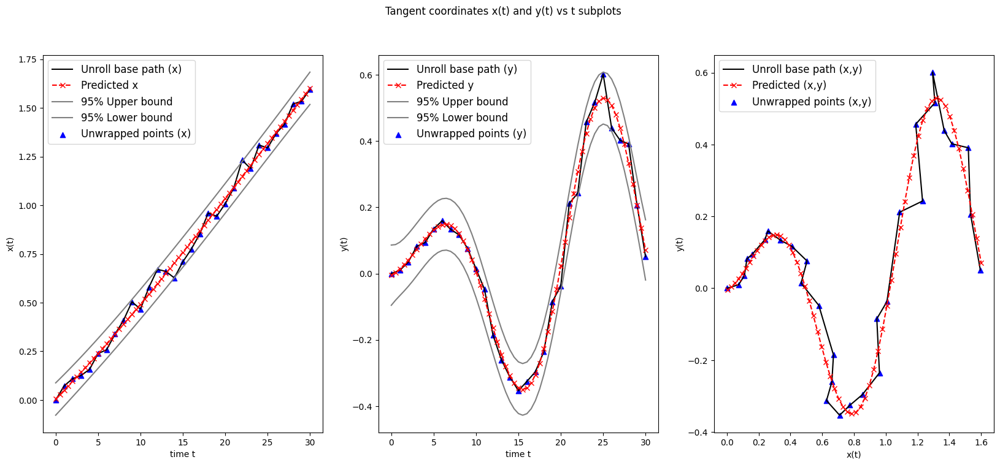

2.38**2 * RBF(length_scale=65.6) + WhiteKernel(noise_level=0.00147)
===
0.349**2 * RBF(length_scale=5.56) + WhiteKernel(noise_level=0.00131)


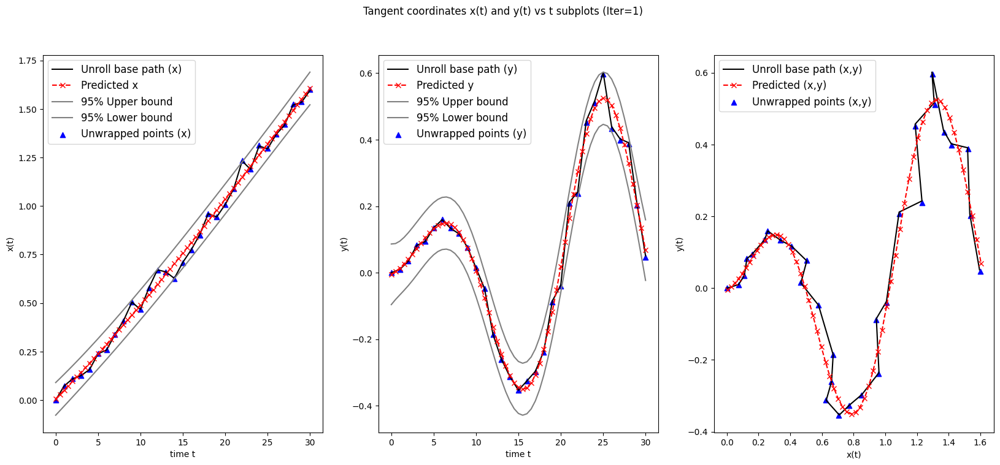

0.002980101300534698
2.38**2 * RBF(length_scale=65.6) + WhiteKernel(noise_level=0.00147)
===
0.349**2 * RBF(length_scale=5.56) + WhiteKernel(noise_level=0.00131)


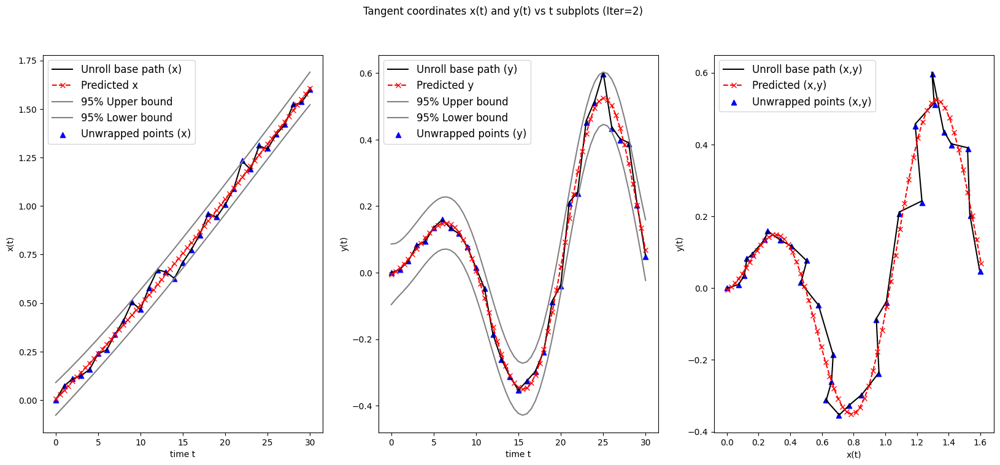

0.00017446563556002453
diff < tol, diff=0.00017446563556002453, tol=0.001


In [ ]:
# Simple case: 1 sample trajectory
(new_points, mean_prediction_x, mean_prediction_y, model_x, model_y) = fitting_GP(initial_base_path = data[0], sample_data=np.expand_dims(data[0], axis=0), tolerance=1e-3)

In [ ]:
model_x.kernel_, model_y.kernel_

(2.38**2 * RBF(length_scale=65.6) + WhiteKernel(noise_level=0.00147),
 0.349**2 * RBF(length_scale=5.56) + WhiteKernel(noise_level=0.00131))

In [ ]:
print(xx)
fig = graph_plotting_3d(data=true_curve(), label="True Curve")
add_traces(data=data[0], fig=fig, col="blue", label="Raw curve")
add_traces(data=new_points, fig=fig, col="red", label="Fitted curve")

fig.show()


# revised_times = revise_times(data)

# samples_x = model_x.sample_y(revised_times.reshape(-1,1), n_samples=3)
# samples_y = model_y.sample_y(revised_times.reshape(-1,1), n_samples=3)

# fig = graph_plotting_3d(data)
# Colors = ["red", "blue", "green", "orange", "purple"]
# for index in range(0,samples_x.shape[1]):
#   sample_x = samples_x[:,index] - samples_x[0,index]
#   sample_y = samples_y[:,index] - samples_y[0,index]
#   combined_sample = np.column_stack([revised_times, sample_x, sample_y, np.zeros_like(revised_times)])
#   wrap = wrapping(data=data, wrap_vectors_on_tangent_plane = combined_sample)
#   add_traces(data=wrap, fig=fig, col=Colors[index])

# fig.show()



[[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]
 [ 5.00000000e-01  3.23590972e-02  6.57981117e-03  9.99454649e-01]
 [ 1.00000000e+00  6.11512990e-02  1.49114166e-02  9.98017118e-01]
 [ 1.50000000e+00  8.36341510e-02  2.64185074e-02  9.96146270e-01]
 [ 2.00000000e+00  1.00281692e-01  4.12001785e-02  9.94105692e-01]
 [ 2.50000000e+00  1.12858053e-01  5.85217629e-02  9.91886215e-01]
 [ 3.00000000e+00  1.25102692e-01  7.56479746e-02  9.89255629e-01]
 [ 3.50000000e+00  1.40750147e-01  9.03794923e-02  9.85911225e-01]
 [ 4.00000000e+00  1.61516261e-01  1.04646975e-01  9.81306022e-01]
 [ 4.50000000e+00  1.87401362e-01  1.20356896e-01  9.74882017e-01]
 [ 5.00000000e+00  2.13769513e-01  1.35320031e-01  9.67466322e-01]
 [ 5.50000000e+00  2.36938477e-01  1.46497858e-01  9.60415814e-01]
 [ 6.00000000e+00  2.61202973e-01  1.51245085e-01  9.53361385e-01]
 [ 6.50000000e+00  2.91217115e-01  1.47951616e-01  9.45147032e-01]
 [ 7.00000000e+00  3.25577567e-01  1.39048665e-01  9.35235113e

#### Prediction Error

Only focus on the mean curve

##### on sphere

In [ ]:
predicted_points_on_sphere = np.array(list(filter(lambda row: row[0] in data[0,:,0], new_points)))
MSE = mse_geodesic(true_curve(), predicted_points_on_sphere)

print(MSE) # 0.0009274241308911144

0.0009274241308911144


##### on tangent plane

In [ ]:
# MSE = mse_euclidean(raw_data = unrolling(data),
#                     predicted_data_on_euclidean_space=combined)

# print(MSE) # 0.011283186829923604

## 4.4 Analysis: Given n sample curves

Samples will be generated from a true curve first, but with some randomness

Note that because we do not know the the true curve, so the method of unrolling is different.
First for each approaches, the first unrolling base path would be the centroid of each time point (suppose there are 5 different curves, each with the same time-point steps, then for each time t, find the centroid of those points at time t. So we will obtain a set of data, that all points are from each centroid at time t)

After that, this section will use different treatments to infer the true curve.

1.  Cubic Smoothing Spline (relative to the base path)
2.  Gaussian Process Regression (using Indepndent GPR)






In [ ]:
n_samples = 10

true_path = true_curve()
#print(true_path)

# importantnp.random.seed(4321)
np.random.seed(43210)
samples = generate_sample_curves(true_path, n_samples, common_sd=.05)
#print(samples.shape)

#print(samples)
initial_base_path = centroid_at_t_on_sphere(samples)
#print(centroid_at_t_on_sphere(samples))

# check the error between connected centroid with the true path on the manifold
MSE = mse_geodesic(true_path, centroid_at_t_on_sphere(samples))
print(MSE)


0.00030787584202025825


draw all sample curves

In [ ]:
fig = graph_plotting_3d(true_curve(), label="True curve")
add_traces(data=initial_base_path, fig=fig, col="red", label="Centroid-connected curve")

Colors = ["blue", "green", "orange"]
#print(Colors)
# for index in range(1,np.minimum(3, samples.shape[0])):
#   add_traces(data=samples[index,], fig=fig, col=Colors[index], label=f"Trace {index}")
fig.show()


### 4.4.1 Cubic Smoothing Spline




[[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]
 [ 1.00000000e+00  5.32158219e-02  7.43572541e-03  9.98555350e-01]
 [ 2.00000000e+00  9.56845396e-02  2.93762852e-02  9.94978142e-01]
 [ 3.00000000e+00  1.29528192e-01  6.20369327e-02  9.89633198e-01]
 [ 4.00000000e+00  2.00529786e-01  1.07452143e-01  9.73777101e-01]
 [ 5.00000000e+00  2.36034054e-01  1.30049744e-01  9.63003110e-01]
 [ 6.00000000e+00  2.95556661e-01  1.66203778e-01  9.40756379e-01]
 [ 7.00000000e+00  3.36789363e-01  1.40819267e-01  9.30990257e-01]
 [ 8.00000000e+00  3.86143250e-01  1.27747641e-01  9.13550180e-01]
 [ 9.00000000e+00  4.50652289e-01  6.56214737e-02  8.90284413e-01]
 [ 1.00000000e+01  5.06117704e-01  1.13717054e-02  8.62389445e-01]
 [ 1.10000000e+01  5.17190178e-01 -9.86081040e-02  8.50171019e-01]
 [ 1.20000000e+01  5.50651288e-01 -1.67088974e-01  8.17841326e-01]
 [ 1.30000000e+01  5.60501985e-01 -2.43618048e-01  7.91509805e-01]
 [ 1.40000000e+01  5.86680676e-01 -3.25905964e-01  7.41344108e

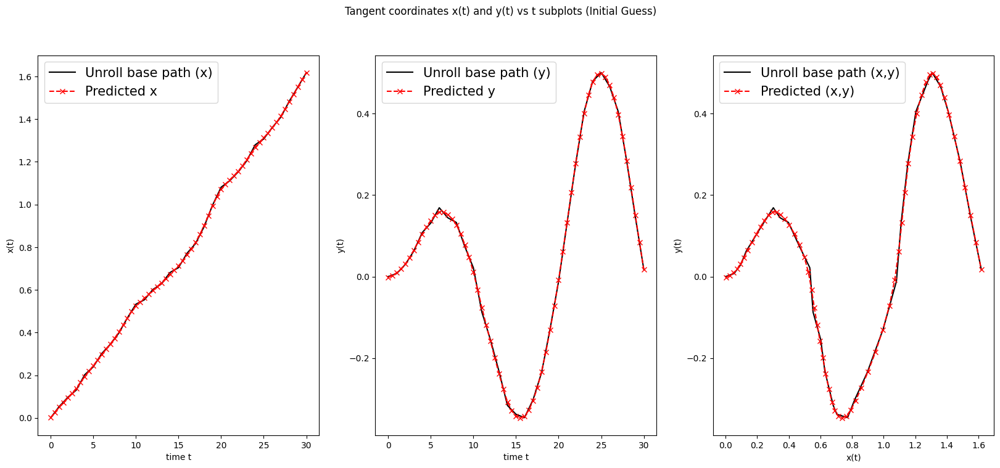

smooth param: x=0.85, y=0.85


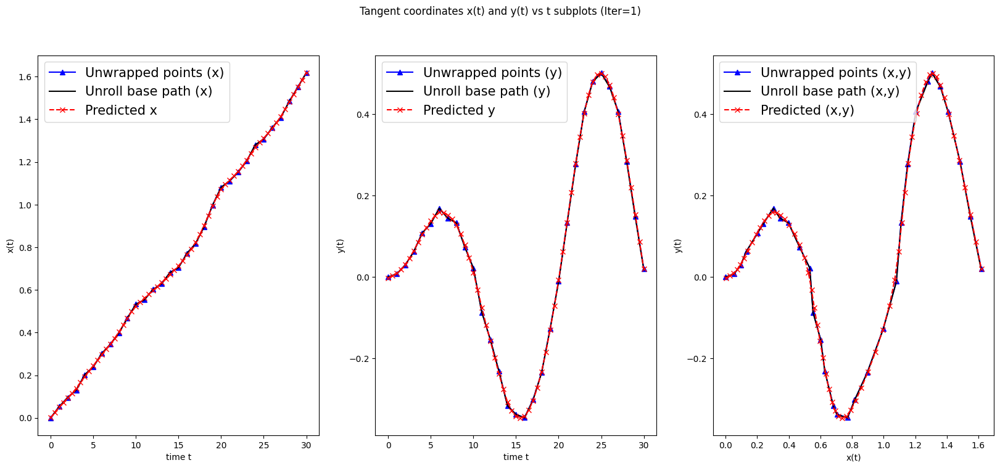

2.5319326799549372e-05
diff < tol, diff=2.5319326799549372e-05, tol=0.001


In [ ]:
print(initial_base_path)

fit = fitting_cubic_smoothing_spline(initial_base_path)



In [ ]:
print(fit)
fig = graph_plotting_3d(samples[0,], label="Trace 1")
add_traces(data=fit, fig=fig, col="red", label="Fitted curve")

Colors = ["blue", "green", "orange", "yellow", "gray", "lime", "skyblue", "pink", "brown", "silver"]
#print(Colors)
for index in range(1, samples.shape[0]):
  colorIndex = index if index < len(Colors) else index % len(Colors)
  add_traces(data=samples[index,], fig=fig, col=Colors[colorIndex], label=f"Trace {index+1}")

add_traces(data=true_curve(), fig=fig, col="black", label="True curve", lineWidth=4)
add_traces(data=fit, fig=fig, col="red", label="Fitted curve", lineWidth=4)


fig.show()

[[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]
 [ 5.00000000e-01  2.50022092e-02  4.91578975e-03  9.99675310e-01]
 [ 1.00000000e+00  4.89657686e-02  1.13057234e-02  9.98736469e-01]
 [ 1.50000000e+00  7.11867625e-02  2.04330706e-02  9.97253696e-01]
 [ 2.00000000e+00  9.22864785e-02  3.27168090e-02  9.95194863e-01]
 [ 2.50000000e+00  1.13439128e-01  4.82119899e-02  9.92374510e-01]
 [ 3.00000000e+00  1.36722529e-01  6.63703845e-02  9.88383489e-01]
 [ 3.50000000e+00  1.63394806e-01  8.62124616e-02  9.82786624e-01]
 [ 4.00000000e+00  1.90648536e-01  1.05701102e-01  9.75951030e-01]
 [ 4.50000000e+00  2.15736641e-01  1.23031188e-01  9.68669721e-01]
 [ 5.00000000e+00  2.39934729e-01  1.38232275e-01  9.60897062e-01]
 [ 5.50000000e+00  2.64845572e-01  1.51047686e-01  9.52387222e-01]
 [ 6.00000000e+00  2.89566936e-01  1.58354844e-01  9.43967549e-01]
 [ 6.50000000e+00  3.13163252e-01  1.57521655e-01  9.36544556e-01]
 [ 7.00000000e+00  3.36822997e-01  1.50598837e-01  9.29446211e

#### Prediction Error

##### on sphere

In [ ]:
predicted_points_on_sphere = np.array(list(filter(lambda row: row[0] in initial_base_path[:,0], fit)))

MSE = mse_geodesic(raw_data = true_path, predicted_points_on_manifold=predicted_points_on_sphere)
print(MSE) #0.00020939606452369063



0.00020939606452369063


##### on tangent plane

In [ ]:
# predicted_points_on_tangent_plane = unrolling(predicted_points_on_sphere)

# MSE = mse_euclidean(raw_data = unrolling(true_path),
#                     predicted_data_on_euclidean_space=predicted_points_on_tangent_plane)

# print(MSE)

#### Findings

Using the connected centroids as the initial path, the mean square error are small

### 4.4.2 Gaussian Process Regression (independent GPR)

Using the given samples, because here we do not have "base path" for the first iteration, we will use the connected centroids. Then each data points will be unwrapped to the tangent plane under this base path. Then perform indenepdent GPR for both x and y respectively.

Then wrap the mean function back to the sphere for the next iteration.

Until converge, then finally perform last GPR to get the final mean function for both x and y, to get the mean square prediction errors and for curves prediction



0.788**2 * RBF(length_scale=7.05) + WhiteKernel(noise_level=0.00248)
===
0.337**2 * RBF(length_scale=5.49) + WhiteKernel(noise_level=0.0012)


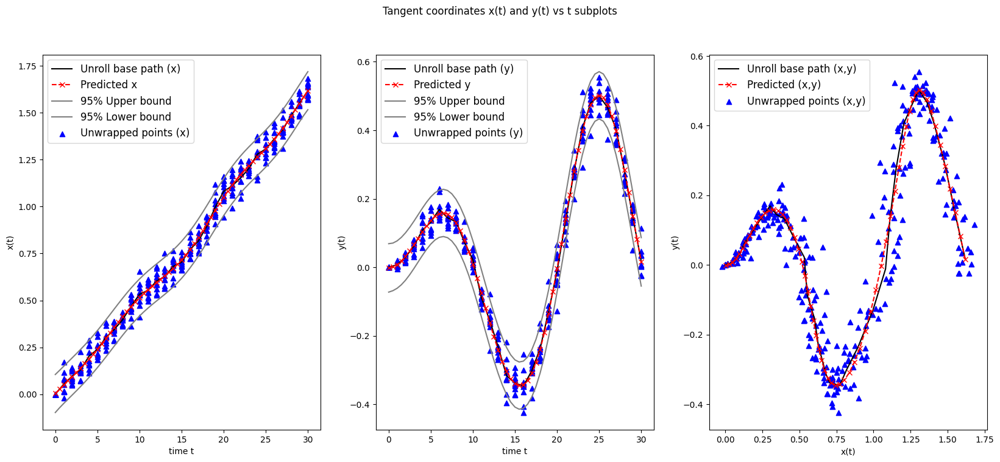

0.787**2 * RBF(length_scale=7.02) + WhiteKernel(noise_level=0.00248)
===
0.337**2 * RBF(length_scale=5.48) + WhiteKernel(noise_level=0.0012)


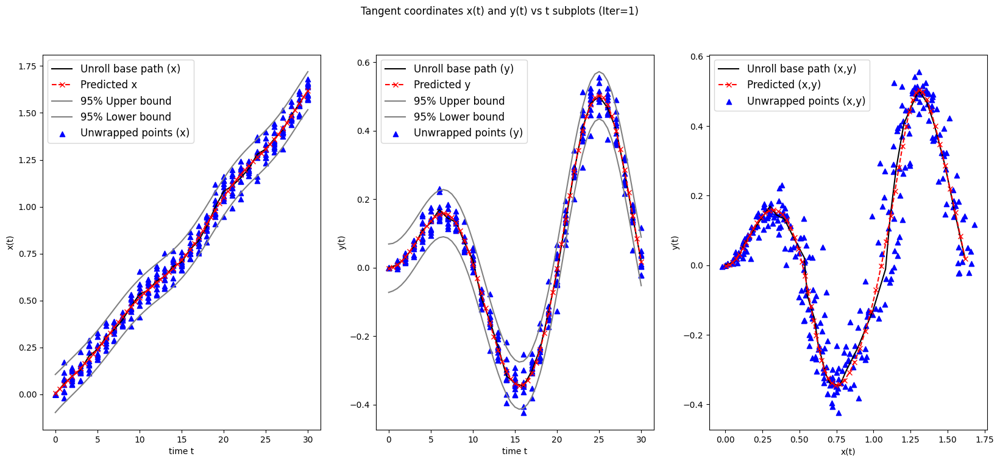

0.0003790526747150275
diff < tol, diff=0.0003790526747150275, tol=0.001


In [ ]:
(new_points, mean_prediction_x, mean_prediction_y, model_x, model_y) = fitting_GP(initial_base_path=initial_base_path, sample_data = samples)

In [ ]:


fig = graph_plotting_3d(samples[0,], label="Trace 1")

Colors = ["blue", "green", "orange", "yellow", "gray", "lime", "skyblue", "pink", "brown", "silver"]
#print(Colors)
for index in range(1, samples.shape[0]):
  colorIndex = index if index < len(Colors) else index % len(Colors)
  add_traces(data=samples[index,], fig=fig, col=Colors[colorIndex], label=f"Trace {index+1}")

add_traces(data=true_curve(), fig=fig, col="black", label="True curve", lineWidth=4)
add_traces(data=new_points, fig=fig, col="red", label="Fitted curve")

fig.show()





#### Prediction Error

##### on sphere

In [ ]:
model_x.kernel_, model_y.kernel

(0.787**2 * RBF(length_scale=7.02) + WhiteKernel(noise_level=0.00248),
 1**2 * RBF(length_scale=1) + WhiteKernel(noise_level=1))

In [ ]:
predicted_points_on_sphere = np.array(list(filter(lambda row: row[0] in data[0,:,0], new_points)))
MSE = mse_geodesic(true_curve(), predicted_points_on_sphere)

print(MSE) # 0.0009274241308911144


0.00021274377280241683


##### on tangent plane

In [ ]:
# MSE = mse_euclidean(raw_data = unrolling(true_path),
#                     predicted_data_on_euclidean_space=combined)

# print(MSE)

In [ ]:
# revised_times = revise_times(true_path)

# sim_n_samples = 5

# random_state = 1234
# samples_x = model_x.sample_y(revised_times.reshape(-1,1), n_samples=sim_n_samples, random_state=random_state)
# samples_y = model_y.sample_y(revised_times.reshape(-1,1), n_samples=sim_n_samples, random_state=random_state)

# #fig = graph_plotting_3d(data)

# mses = []
# Colors = ["red", "blue", "green", "orange", "purple"]
# Colors = np.concatenate([Colors, Colors, Colors, Colors, Colors, Colors, Colors, Colors, Colors, Colors, Colors, Colors, Colors, Colors, Colors, Colors, Colors, Colors, ])
# for index in range(0,samples_x.shape[1]):
#   sample_x = samples_x[:,index] - samples_x[0,index]
#   sample_y = samples_y[:,index] - samples_y[0,index]
#   combined_sample = np.column_stack([revised_times, sample_x, sample_y, np.zeros_like(revised_times)])
#   wrap = wrapping(data=predicted_points_on_sphere, wrap_vectors_on_tangent_plane = combined_sample)
# #  add_traces(data=wrap, fig=fig, col=Colors[index])
#   combined = np.array(list(filter(lambda row: row[0] in true_path[:,0], wrap)))
#   mses.append(mse_geodesic(true_path, combined))

# #fig.show()

# print(np.mean(mses))
# # 0.06287610709125845, for n=1, with sim_n_samples=50

# # 0.05289590521024859, for n=2, with sim_n_samples=50

# # 0.07926827829541497, for n=3, with sim_n_samples=1
# # 0.0450141533785771, for n=3, with sim_n_samples=5
# # 0.04567803094145398, for n=3, with sim_n_samples=10
# # 0.05029944336058663, for n=3, with sim_n_samples=50
# # 0.050849538051084615, for n=3, with sim_n_samples=100

# # 0.09711177448517323, for n=4, with sim_n_samples=1
# # 0.05061171924638119, for n=4, with sim_n_samples=5
# # 0.04951976261061909, for n=4, with sim_n_samples=10
# # 0.04470240445168722, for n=4, with sim_n_samples=50
# # 0.04555064665966319, for n=4, with sim_n_samples=100

# # 0.040127688874300356, for n=10, with sim_n_samples=50
# # 0.038306101271766736, for n=12, with sim_n_samples=50
# # 0.035717259669620534, for n=23, with sim_n_samples=50
# # 0.035951082861385236, for n=25, with sim_n_samples=50

# # 0.038676803473470744, for n=30, with sim_n_samples=50
# # 0.03546262392942086, for n=40, with sim_n_samples=50
# # , for n=, with sim_n_samples=
# # , for n=, with sim_n_samples=
# # , for n=, with sim_n_samples=

# # 0.035902328090752514, for n=75 with sim_n_samples=50


# # 0.038843563138428, for n=100, with sim_n_samples=50



## 4.5 Comparison

In [ ]:
np.random.seed(12345)
def simulate_comparison(sim_size=[1]):

  df = pd.DataFrame()
  for n_samples in sim_size:
    print(n_samples)

    samples = generate_sample_curves(true_path, n_samples, common_sd=.05)
    initial_base_path = centroid_at_t_on_sphere(samples)

    # css - cubic smoothing spline
    css_fit = fitting_cubic_smoothing_spline(initial_base_path)

    css_predicted_points_on_sphere = np.array(list(filter(lambda row: row[0] in initial_base_path[:,0], css_fit)))
    css_MSE = mse_geodesic(raw_data = true_path, predicted_points_on_manifold=css_predicted_points_on_sphere)

    # gpr - gaussian processes regression
    (gpr_new_points, gpr_mean_prediction_x, gpr_mean_prediction_y, gpr_model_x, gpr_model_y) = fitting_GP(initial_base_path=initial_base_path, sample_data = samples)
    gpr_predicted_points_on_sphere = np.array(list(filter(lambda row: row[0] in data[0,:,0], gpr_new_points)))
    gpr_MSE = mse_geodesic(true_curve(), gpr_predicted_points_on_sphere)

    new_row = pd.DataFrame({"n":[n_samples], "Cubic Smoothing Spline": [css_MSE], "Gaussian Process Regression": [gpr_MSE]})

    df = pd.concat([df, new_row])
    print(df)

    fig = graph_plotting_3d(true_curve(), label="True Curve")
    add_traces(data=css_fit, fig=fig, col="red", label="Fitted curve (Cubic Smoothing Spline)")
    add_traces(data=gpr_new_points, fig=fig, col="blue", label="Fitted curve (Gaussian Processes Regression)")
    fig.show()

  return df


1
smooth param: x=0.85, y=0.85


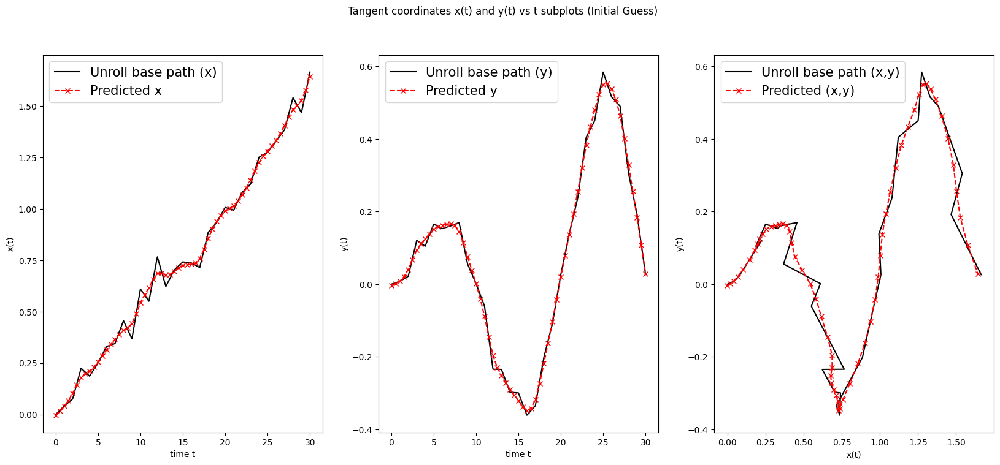

smooth param: x=0.85, y=0.85


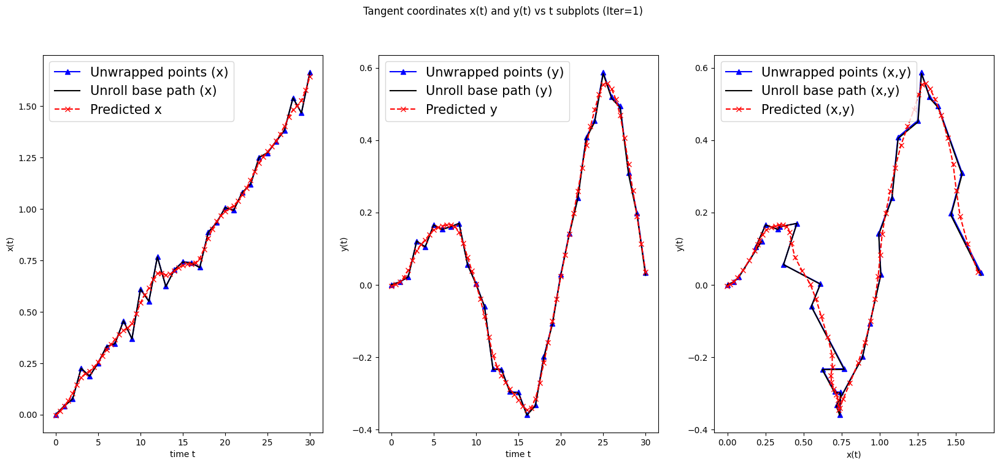

0.00015853104852990118
diff < tol, diff=0.00015853104852990118, tol=0.001
1.42**2 * RBF(length_scale=20.7) + WhiteKernel(noise_level=0.00327)
===
0.354**2 * RBF(length_scale=5.27) + WhiteKernel(noise_level=0.000998)


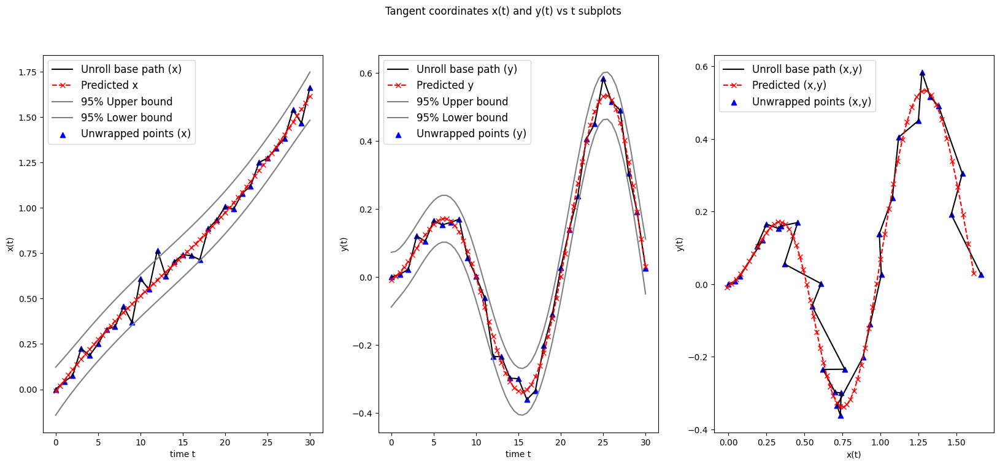

1.41**2 * RBF(length_scale=20.7) + WhiteKernel(noise_level=0.0033)
===
0.354**2 * RBF(length_scale=5.28) + WhiteKernel(noise_level=0.000999)


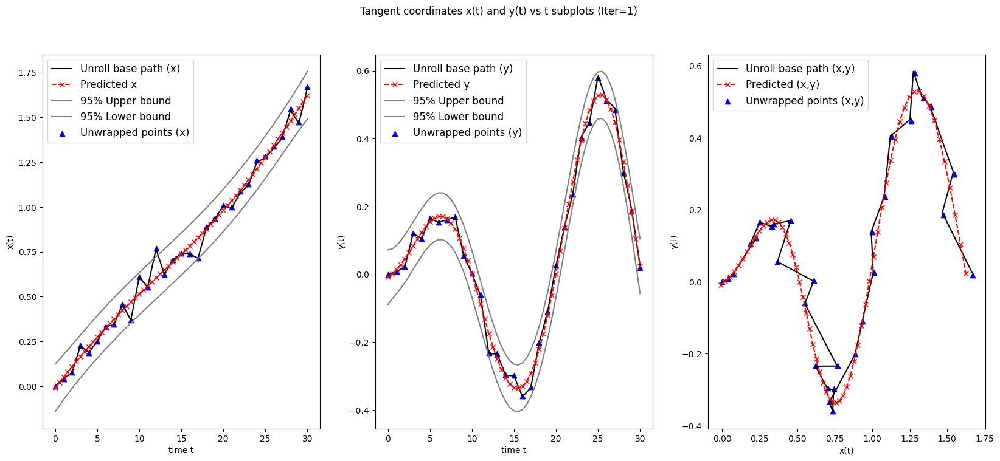

0.0030351775851931643
1.41**2 * RBF(length_scale=20.7) + WhiteKernel(noise_level=0.00331)
===
0.354**2 * RBF(length_scale=5.27) + WhiteKernel(noise_level=0.000999)


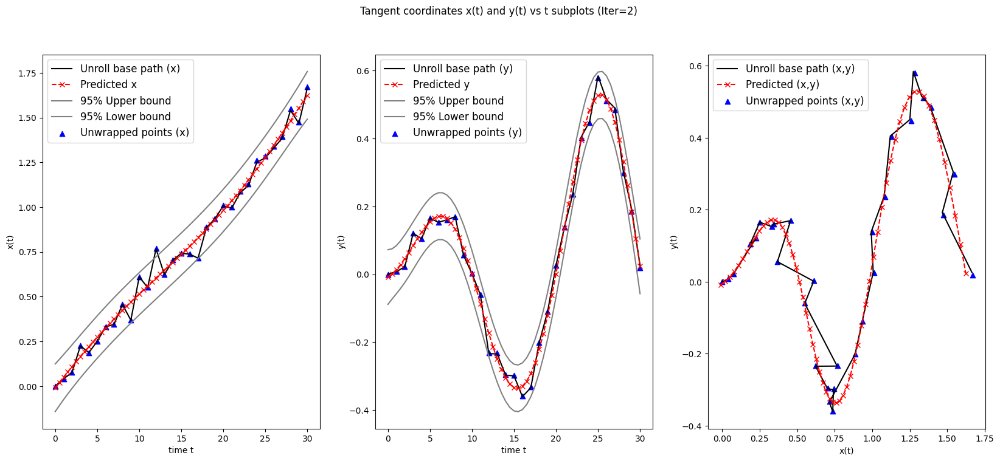

0.00018572272448177574
diff < tol, diff=0.00018572272448177574, tol=0.001
   n  Cubic Smoothing Spline  Gaussian Process Regression
0  1                0.002204                     0.001465


3
smooth param: x=0.85, y=0.85


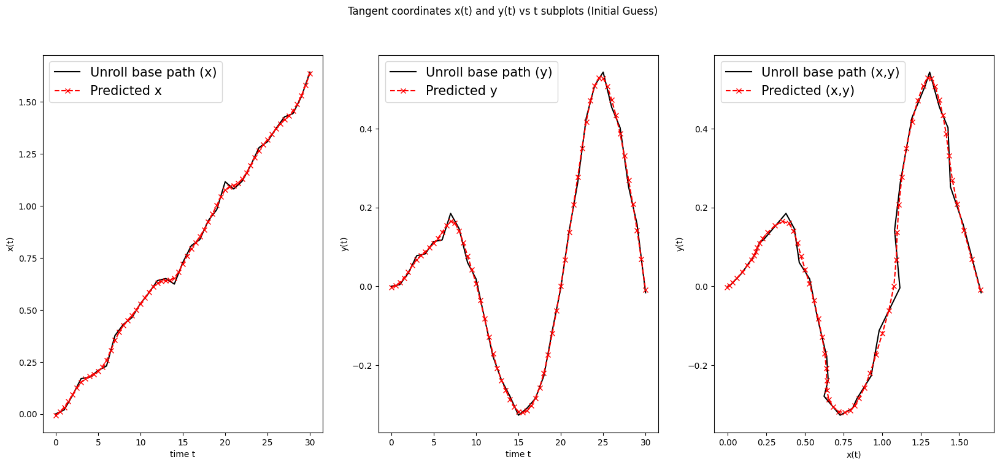

smooth param: x=0.85, y=0.85


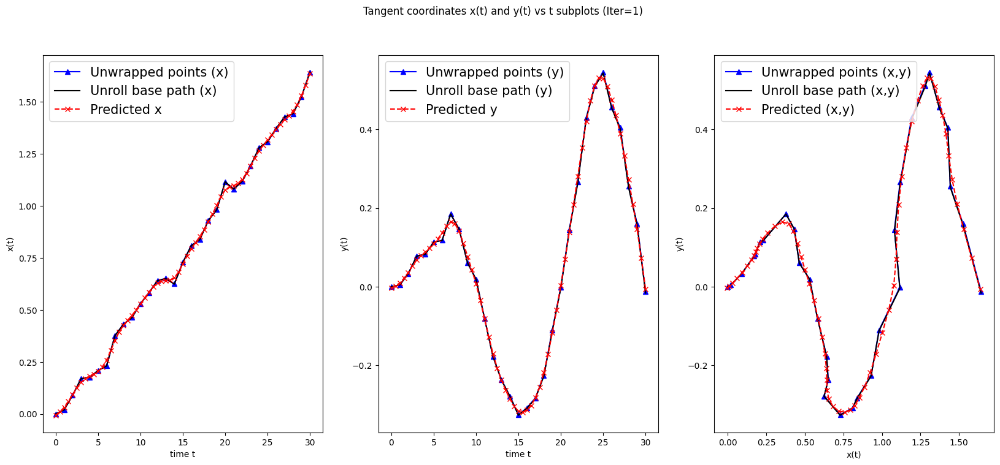

6.244538151470473e-05
diff < tol, diff=6.244538151470473e-05, tol=0.001
3.9**2 * RBF(length_scale=110) + WhiteKernel(noise_level=0.0024)
===
0.281**2 * RBF(length_scale=4.6) + WhiteKernel(noise_level=0.00129)


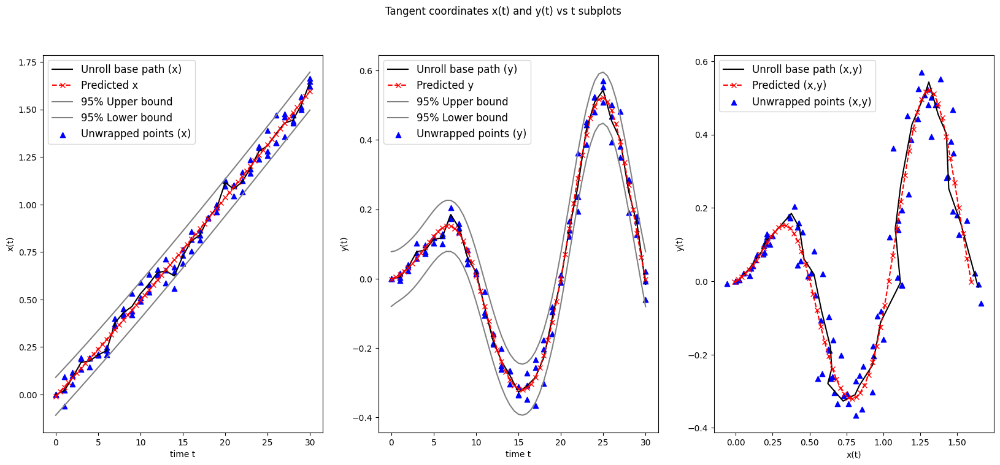

3.8**2 * RBF(length_scale=106) + WhiteKernel(noise_level=0.00242)
===
0.28**2 * RBF(length_scale=4.59) + WhiteKernel(noise_level=0.00129)


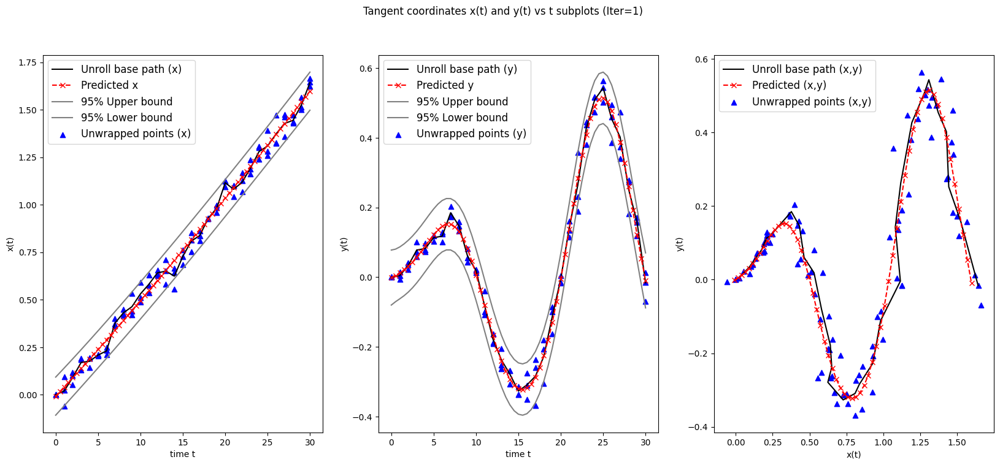

0.003040611727609504
3.8**2 * RBF(length_scale=106) + WhiteKernel(noise_level=0.00242)
===
0.28**2 * RBF(length_scale=4.59) + WhiteKernel(noise_level=0.00129)


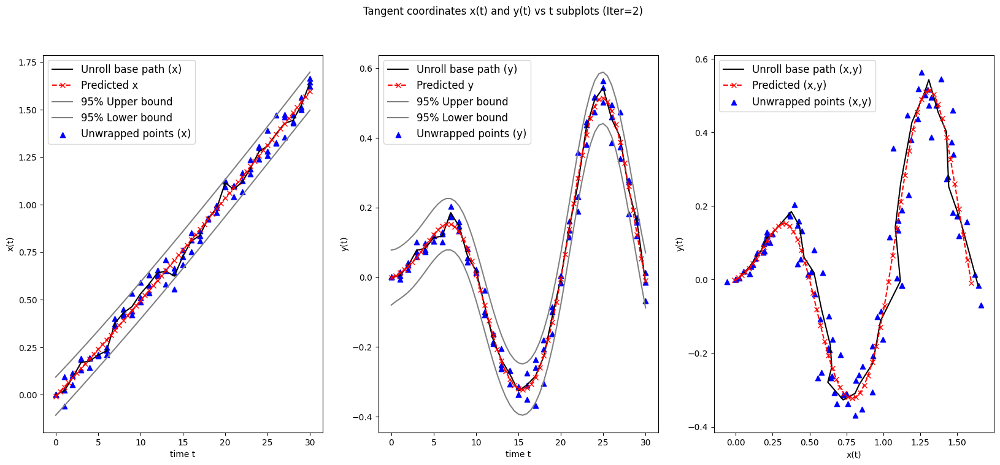

0.00013079060977430983
diff < tol, diff=0.00013079060977430983, tol=0.001
   n  Cubic Smoothing Spline  Gaussian Process Regression
0  1                0.002204                     0.001465
0  3                0.000711                     0.000721


5
smooth param: x=0.85, y=0.85


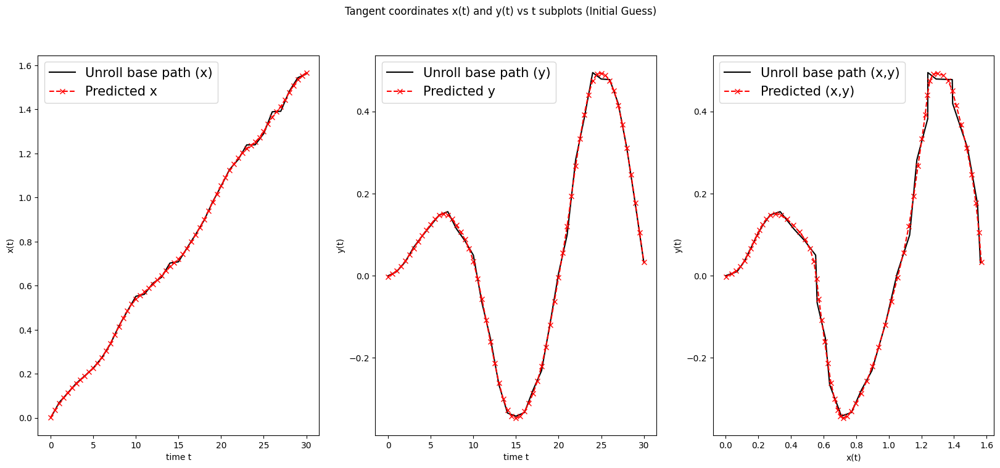

smooth param: x=0.85, y=0.85


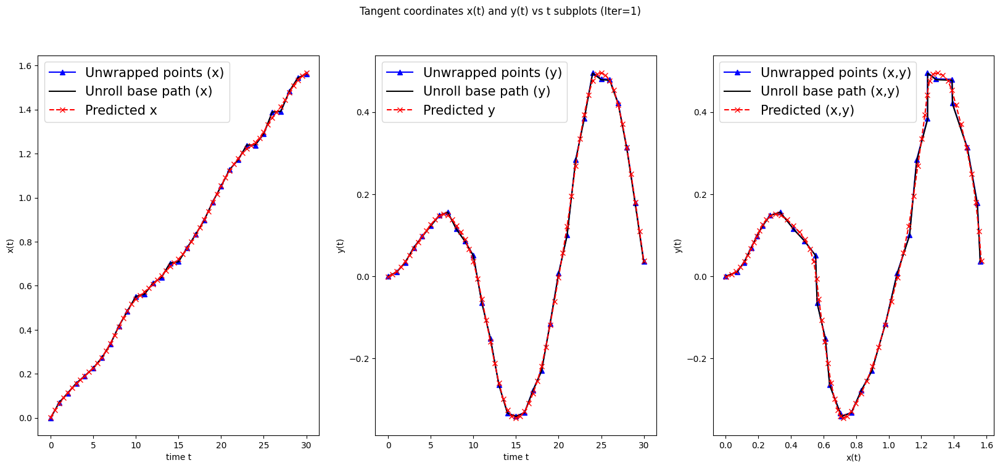

3.8627799350729435e-05
diff < tol, diff=3.8627799350729435e-05, tol=0.001
0.757**2 * RBF(length_scale=6.46) + WhiteKernel(noise_level=0.00233)
===
0.275**2 * RBF(length_scale=4.66) + WhiteKernel(noise_level=0.00144)


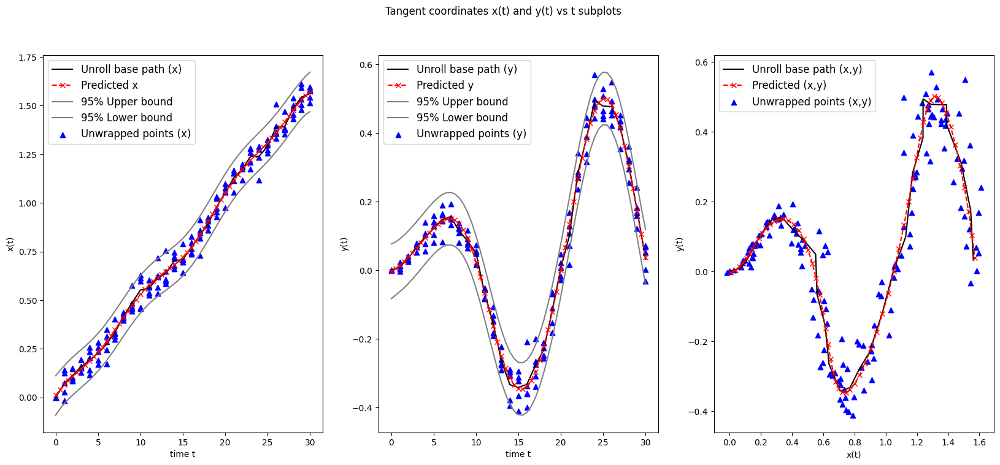

0.758**2 * RBF(length_scale=6.43) + WhiteKernel(noise_level=0.00233)
===
0.275**2 * RBF(length_scale=4.67) + WhiteKernel(noise_level=0.00144)


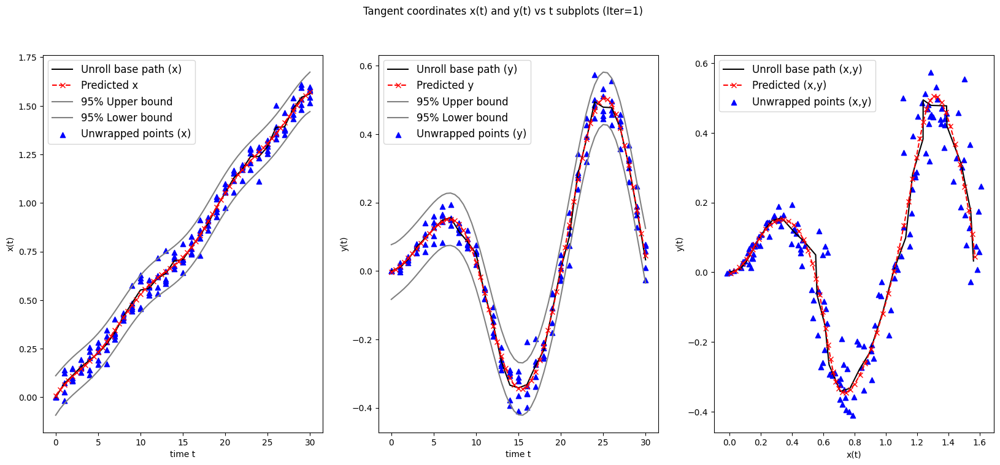

0.00040016240604925007
diff < tol, diff=0.00040016240604925007, tol=0.001
   n  Cubic Smoothing Spline  Gaussian Process Regression
0  1                0.002204                     0.001465
0  3                0.000711                     0.000721
0  5                0.000382                     0.000376


7
smooth param: x=0.85, y=0.85


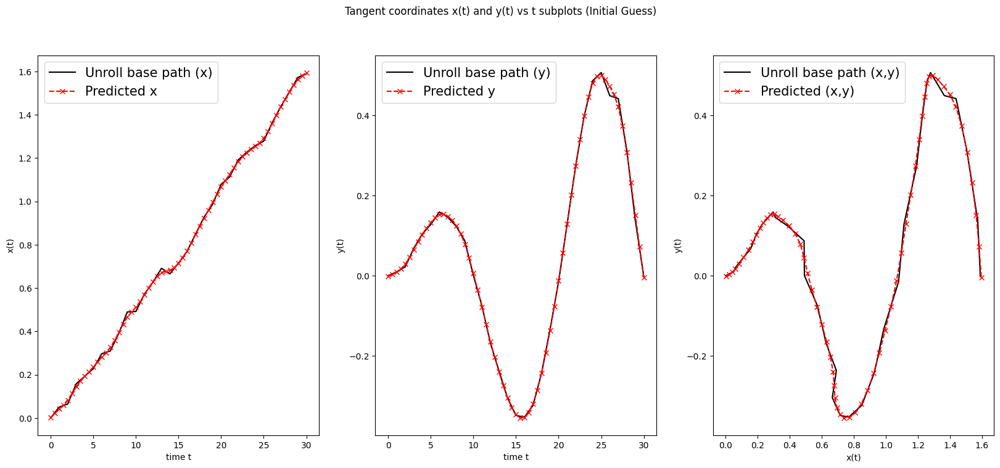

smooth param: x=0.85, y=0.85


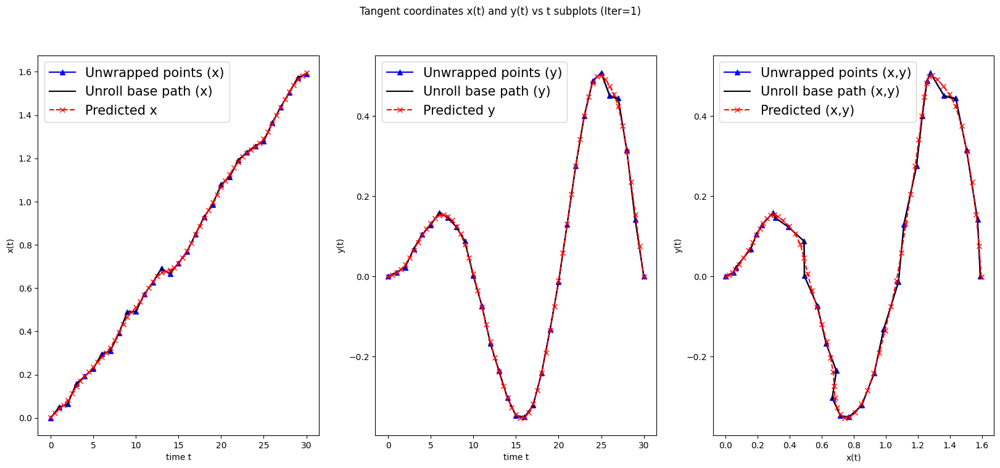

3.091368267954344e-05
diff < tol, diff=3.091368267954344e-05, tol=0.001
0.71**2 * RBF(length_scale=5.79) + WhiteKernel(noise_level=0.00219)
===
0.461**2 * RBF(length_scale=6.32) + WhiteKernel(noise_level=0.00109)


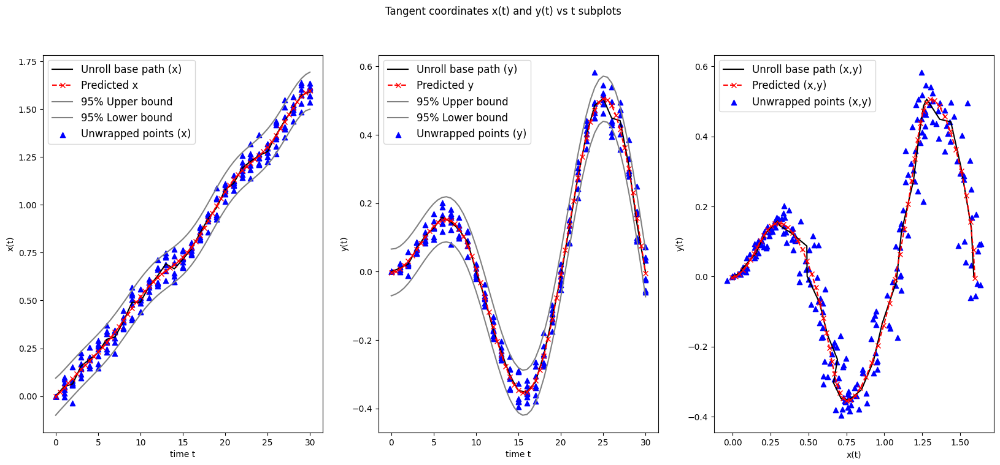

0.711**2 * RBF(length_scale=5.79) + WhiteKernel(noise_level=0.00219)
===
0.462**2 * RBF(length_scale=6.34) + WhiteKernel(noise_level=0.00109)


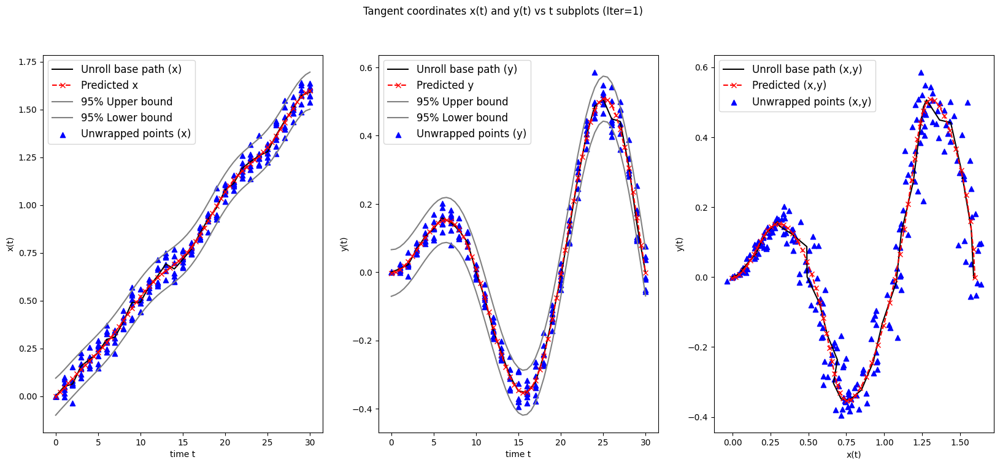

0.00012052786161699342
diff < tol, diff=0.00012052786161699342, tol=0.001
   n  Cubic Smoothing Spline  Gaussian Process Regression
0  1                0.002204                     0.001465
0  3                0.000711                     0.000721
0  5                0.000382                     0.000376
0  7                0.000175                     0.000108


10
smooth param: x=0.85, y=0.85


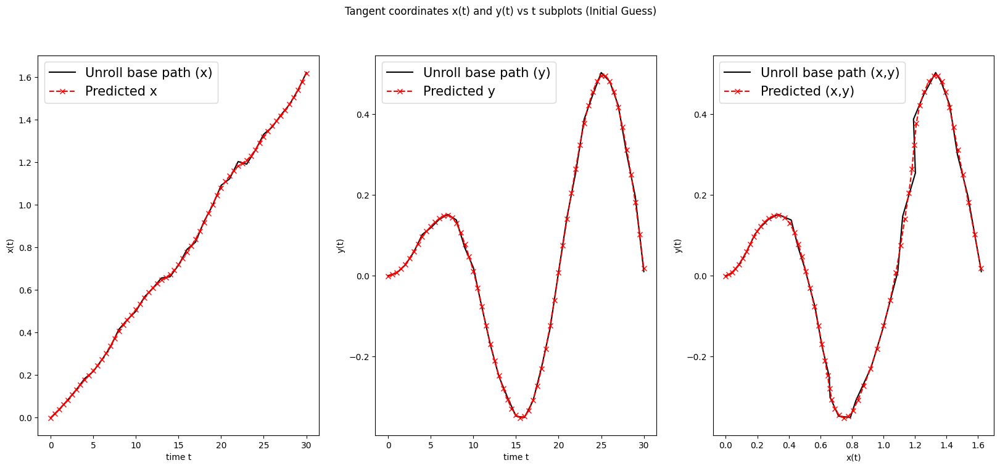

smooth param: x=0.85, y=0.85


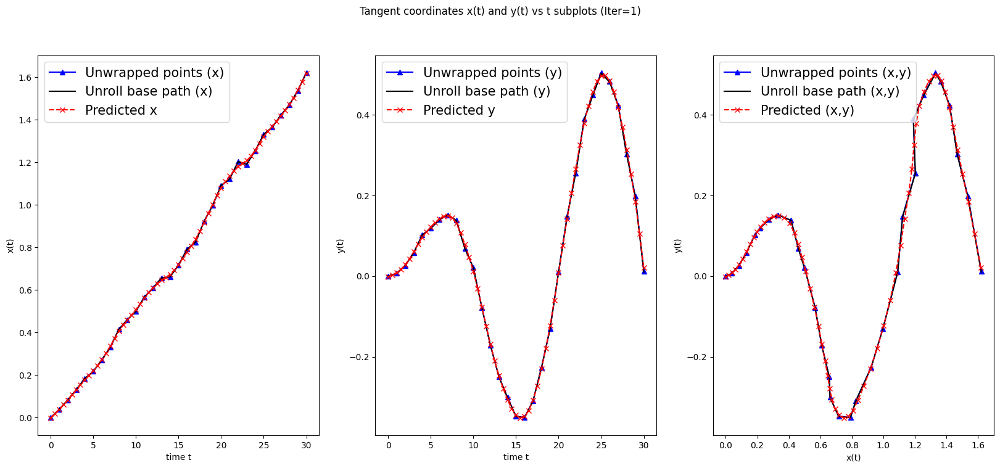

2.7524530164042258e-05
diff < tol, diff=2.7524530164042258e-05, tol=0.001
0.789**2 * RBF(length_scale=6.94) + WhiteKernel(noise_level=0.00236)
===
0.527**2 * RBF(length_scale=6.81) + WhiteKernel(noise_level=0.00143)


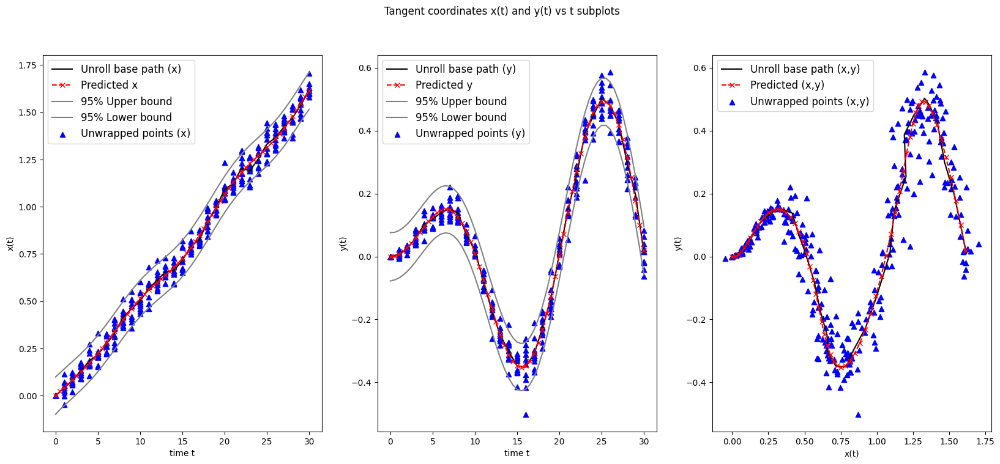

0.789**2 * RBF(length_scale=6.93) + WhiteKernel(noise_level=0.00236)
===
0.526**2 * RBF(length_scale=6.81) + WhiteKernel(noise_level=0.00143)


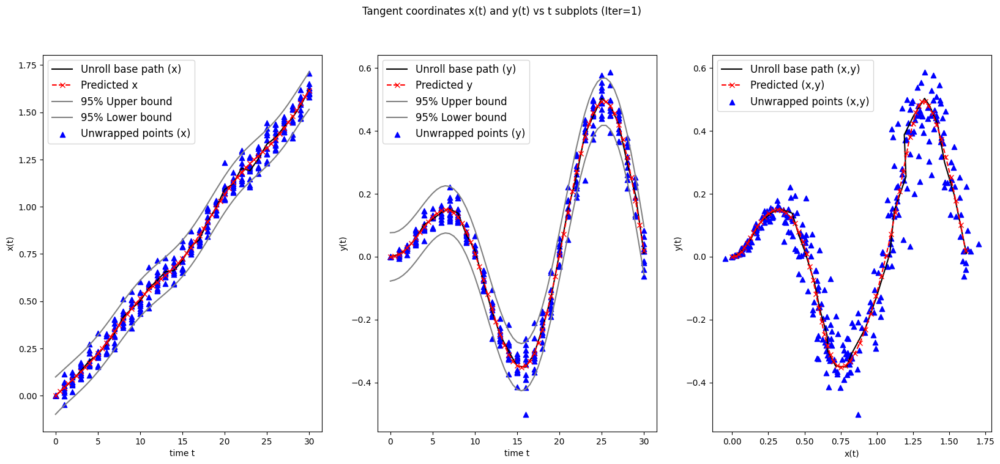

0.00023641472743903135
diff < tol, diff=0.00023641472743903135, tol=0.001
    n  Cubic Smoothing Spline  Gaussian Process Regression
0   1                0.002204                     0.001465
0   3                0.000711                     0.000721
0   5                0.000382                     0.000376
0   7                0.000175                     0.000108
0  10                0.000152                     0.000135


In [ ]:
# to replicate dissertation paper, use the followings
#sample_sizes = [1,3,5,7,10,15,20,25,30,35,40,45,50]
sample_sizes = [1,3,5,7,10]

df = simulate_comparison(sample_sizes)

In [ ]:
df


# % n	Cubic Smoothing Spline	Gaussian Process Regression
# % 0	1	0.002204	0.001465
# % 0	3	0.000711	0.000721
# % 0	5	0.000382	0.000376
# % 0	7	0.000175	0.000108
# % 0	10	0.000152	0.000135
# % 0	15	0.000133	0.000109
# % 0	20	0.000097	0.000087
# % 0	25	0.000086	0.000088
# % 0	30	0.000053	0.000045
# % 0	35	0.000053	0.000036
# % 0	40	0.000040	0.000026
# % 0	45	0.000043	0.000048
# % 0	50	0.000041	0.000023

,n,Cubic Smoothing Spline,Gaussian Process Regression
0,1,0.002204,0.001465
0,3,0.000711,0.000721
0,5,0.000382,0.000376
0,7,0.000175,0.000108
0,10,0.000152,0.000135


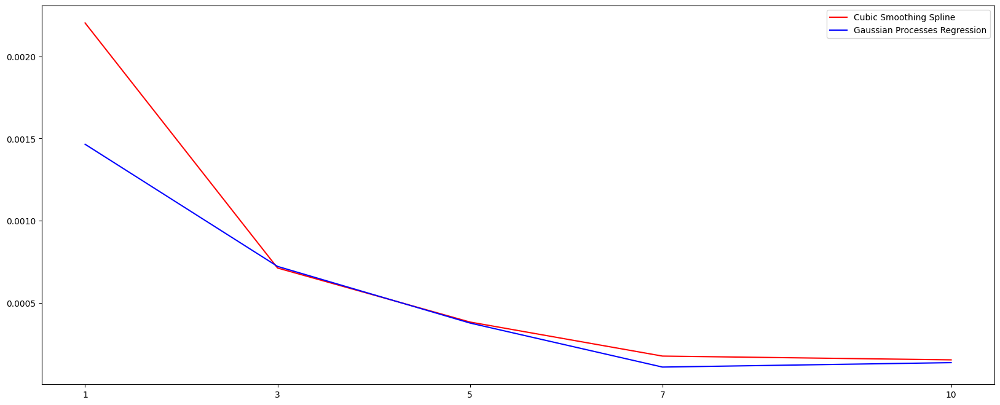

In [ ]:
plt.plot(df.iloc[:,0], df.iloc[:,1], color="red", label="Cubic Smoothing Spline")
plt.plot(df.iloc[:,0], df.iloc[:,2], color="blue", label="Gaussian Processes Regression")
plt.legend()
plt.xticks(df.iloc[:,0])
plt.show()

In [ ]:
list(df.iloc[:,1])

[0.0022042767054441226,
 0.0007114387847804605,
 0.0003822549880462235,
 0.000174935089839059,
 0.000151930822085407]

# Section 5: Forecasting and Uncertainty of coordinates

## 5.1 Scatter plot of vectors coordinates on the unrolling space

0.871**2 * RBF(length_scale=7.87) + WhiteKernel(noise_level=0.00423)
===
0.322**2 * RBF(length_scale=5.27) + WhiteKernel(noise_level=0.00213)


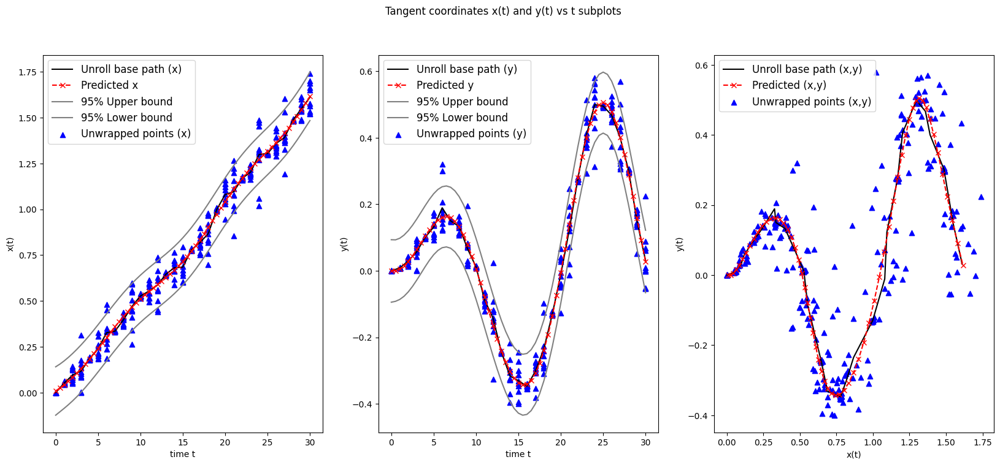

0.866**2 * RBF(length_scale=7.8) + WhiteKernel(noise_level=0.00423)
===
0.321**2 * RBF(length_scale=5.27) + WhiteKernel(noise_level=0.00213)


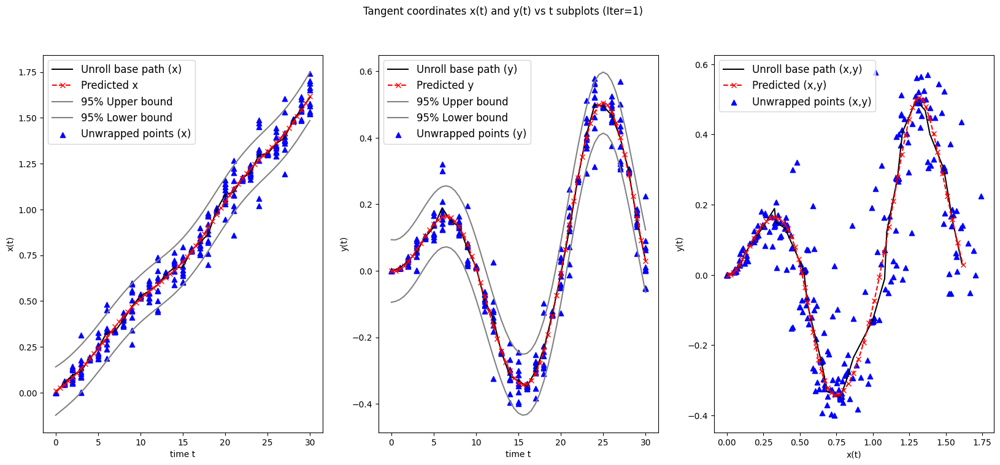

0.0005631965275244665
diff < tol, diff=0.0005631965275244665, tol=0.001


In [ ]:
n_samples = 10

true_path = true_curve()
#print(true_path)

np.random.seed(43210)
samples = generate_sample_curves(true_path, n_samples)
initial_base_path = centroid_at_t_on_sphere(samples)


(new_points, mean_prediction_x, mean_prediction_y, model_x, model_y) = fitting_GP(initial_base_path=initial_base_path, sample_data = samples)

Unrolling space, with the scatter plot for each time t

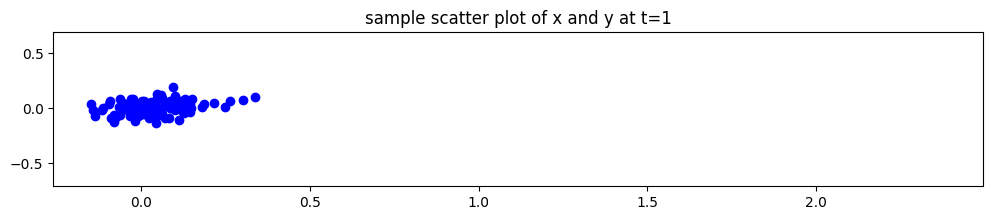

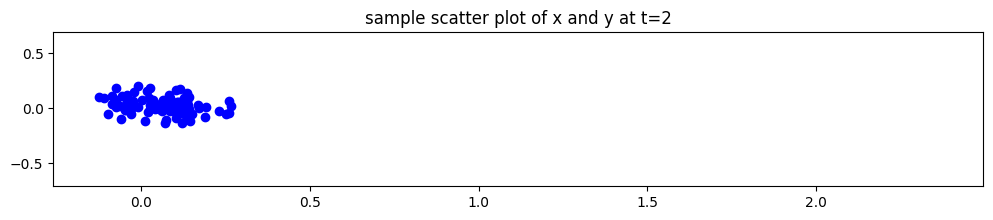

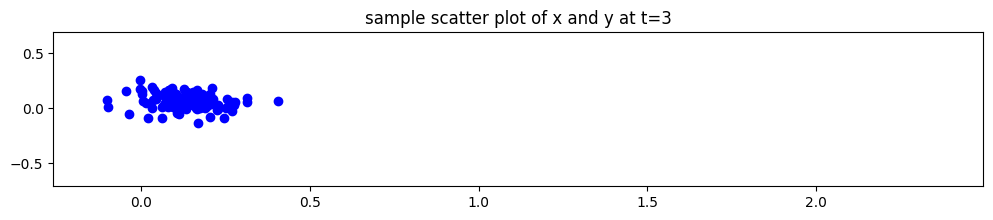

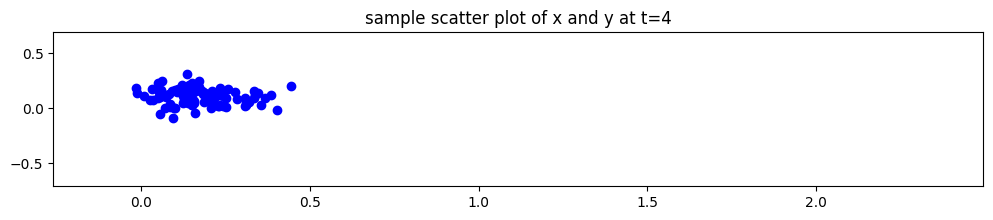

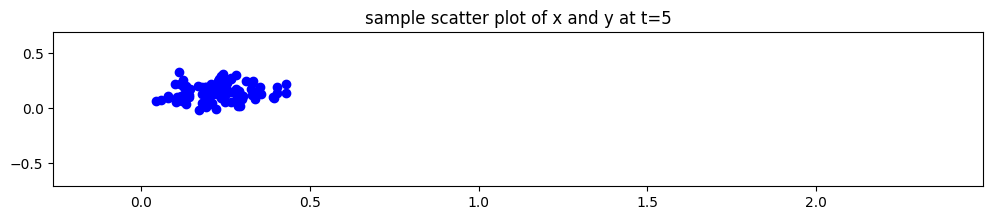

...

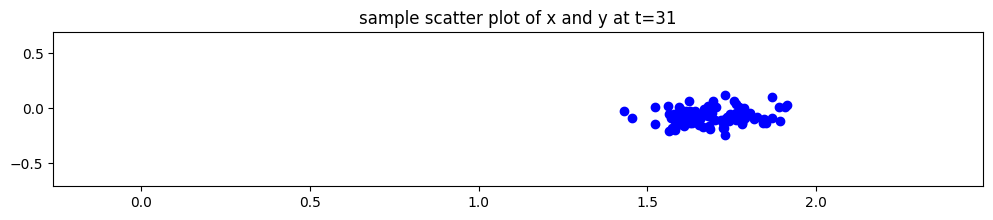

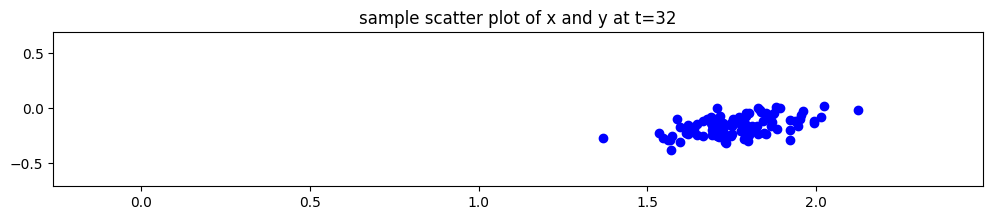

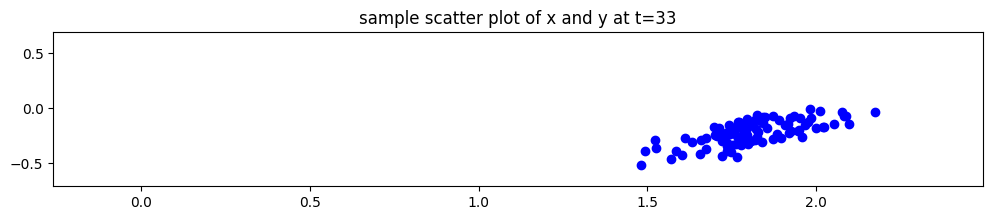

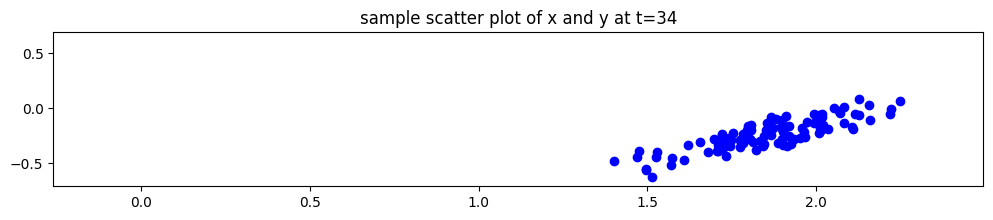

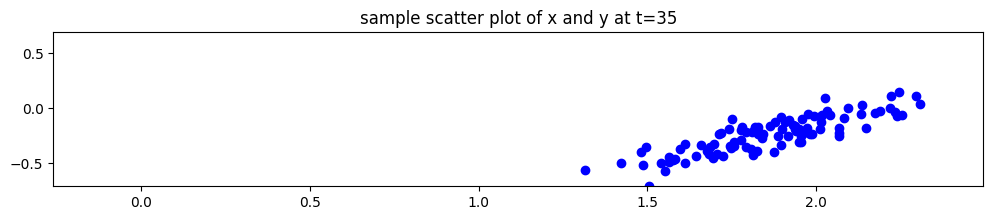

In [ ]:
specific_t2 = np.arange(0, 36, 1).astype("int32").reshape(-1, 1)

sim_n_samples = 100

random_state = 1234
samples_x2 = model_x.sample_y(specific_t2, n_samples=sim_n_samples)
samples_y2 = model_y.sample_y(specific_t2, n_samples=sim_n_samples)


for index in range(1, specific_t2.squeeze().shape[0]):
  tt2 = specific_t2.squeeze()[index]

  sx = samples_x2[index, :] - samples_x2[0, :]
  sy = samples_y2[index, :] - samples_y2[0, :]


  plt.figure(figsize=(12,2))
  plt.scatter(sx, sy, c="b")
  plt.title(f"sample scatter plot of x and y at t={tt2}")

  plt.xlim([np.min(samples_x2)-.1, np.max(samples_x2)+.1])
  plt.ylim([np.min(samples_y2)-.1, np.max(samples_y2)+.1])

  plt.show()

In [ ]:
pd.DataFrame({"t":specific_t2.squeeze(),
              "x": model_x.predict(specific_t2),
              "y": model_y.predict(specific_t2)})

,t,x,y
0,0,0.008557,-0.000553
1,1,0.043736,0.005865
2,2,0.084404,0.028406
3,3,0.131186,0.063659
4,4,0.183802,0.104200
5,5,0.240949,0.140104
6,6,0.300435,0.161279
7,7,0.359565,0.159892
8,8,0.415697,0.132196
9,9,0.466860,0.079252


31


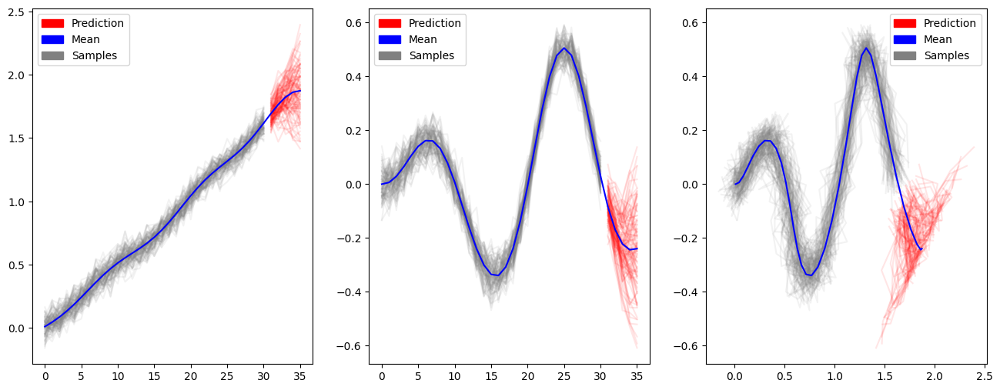

In [ ]:
revised_times = revise_times(samples[0])

f, (y1_ax, y2_ax, y3_ax) = plt.subplots(1, 3, figsize=(16, 6))

end = np.argmax(specific_t2 > np.max(revised_times))
print(end)

for index in range(samples_x2.shape[1]):
  y1_ax.plot(specific_t2[:end], samples_x2[:end, index], c="gray", alpha=.1)
  y1_ax.plot(specific_t2[end:], samples_x2[end:, index], c="red", alpha=.1)

# Predictive mean as blue line
y1_ax.plot(specific_t2, model_x.predict(specific_t2), 'b')


#y1_ax.set_ylim([-3, 3])
# y1_ax.legend(['Observed Data', 'Mean', 'Confidence'])
# y1_ax.set_title('Observed Values (Likelihood)')

for index in range(samples_y2.shape[1]):
  y2_ax.plot(specific_t2[:end], samples_y2[:end, index], c="gray", alpha=.1)
  y2_ax.plot(specific_t2[end:], samples_y2[end:, index], c='red', alpha=.1)

# Predictive mean as blue line
y2_ax.plot(specific_t2, model_y.predict(specific_t2), 'b')


#y1_ax.set_ylim([-3, 3])
# y2_ax.set_title('Observed Values (Likelihood)')

for index in range(samples_x2.shape[1]):
  y3_ax.plot(samples_x2[:end, index], samples_y2[:end, index], c="gray", alpha=.1)
  y3_ax.plot(samples_x2[end:, index], samples_y2[end:, index], c="red", alpha=.1)

# Predictive mean as blue line
y3_ax.plot(model_x.predict(specific_t2), model_y.predict(specific_t2), 'b')


#y1_ax.set_ylim([-3, 3])
#y3_ax.legend(['Observed Data', 'Mean', 'Confidence'])
# y3_ax.set_title('Observed Values (Likelihood)')


import matplotlib.patches as mpatches

red_patch = mpatches.Patch(color='red', label='Prediction')
blue_patch = mpatches.Patch(color='blue', label='Mean')
gray_patch = mpatches.Patch(color='gray', label='Samples')

y1_ax.legend(handles=[red_patch, blue_patch, gray_patch])
y2_ax.legend(handles=[red_patch, blue_patch, gray_patch])
y3_ax.legend(handles=[red_patch, blue_patch, gray_patch])



plt.show()



## 5.2 Future position forecasting

Using GPR above, and we can define a "N-step ahead" estimation of the position on the Sphere by the steps:
1. using GPR to predict future time point (better using the same time-step), say $\hat{v_{x}}(T+1)$ for x and $\hat{v_{y}}(T+1)$, combine both with making v_z=0 to make new tangent vector $\hat{v}(T+1)$=($\hat{v_{x}}(T+1)$, $\hat{v_{y}}(T+1)$, 0)
2. calculate the reverse process of unrolling, and parallel transport this vector $\hat{v}(T+1)$ to the latest point on the Sphere g(T)
3. perform exponential_map, with contact point = g(T), and the tangent vector = $\hat{v}$



Because of the current method of unrolling, unwrapping and wrapping, it relies on the path (in discrete time point) on the sphere. So for instance if we just observe up to $t_n$ = T, then the path is just defined up to $g(T)$

If we need to forcast future time point, say 2 more steps, $t_{n+1}$, $t_{n+2}$, we need a way to predict $\hat{g}(t_{n+1})$ and $g*(t_{n+1})$

I suggest simply by the simple geodesic distance to travel with:
1. at the lastest position,
2. the initial velocity (direction) and
3. time taken.

This should somehow make sense because if we know where is the lastest position and where is it heading to, then from distance travel concept, we know that where will be the next position after known time taken.

But we need to note that, from current simulation settings, we have no information about the true curve, but we have n samples path.

Based on these n samples path, by the use of section 4 using GPR, we can find the mean x and y coordinates of the vectors on the unrolling space.










In [ ]:
def true_curve_with_future():
  """
  Suppose the true curve is staring at the North pole
  """

  us = np.arange(0,36) / 5 *np.pi/12
  vs = np.pi/6 * np.sin(6*us)

  path = np.empty(shape=(0,4))

  ts = np.arange(0, len(us))

  for t in ts:
    u = us[t]
    v = vs[t]
    xyz = uv_2_xyz(u,v)
    p = np.append(t, xyz)

    path = np.vstack((path, p))

  return path

In [ ]:
def future_point_on_sphere_prediction(data, future_time, gpr_x, gpr_y, append=True):
  """
  data: the points on the Sphere, either the 'true' time sequence or the estimated in section 4
  future_time: an np array that wish to find, 1d array with k future time value
  gpr_x: the fitted gpr for x
  gpr_y: the fitted gpr for y
  append: if True -> append at the bottom of data in (n+1) x 4 array
          else -> simply the latest result in k*4 array [[t,x,y,z]]

  """
  latest_time = np.max(data[:,0])
  if np.count_nonzero(future_time <= latest_time) > 0:
    raise Exception(f"Cannot pass future_time smaller than latest time, latest_time={latest_time}, passed future_time={future_time}")

  timepoints_with_history = np.append(data[:,0], future_time)

  future_vectors_x = model_x.predict(timepoints_with_history.reshape(-1,1))
  future_vectors_y = model_y.predict(timepoints_with_history.reshape(-1,1))

  # adjust starting point (0,0)
  future_vectors_x = (future_vectors_x - future_vectors_x[0])[1:]
  future_vectors_y = (future_vectors_y - future_vectors_y[0])[1:]

  # just keep futures
  future_vectors_x = future_vectors_x[-1*len(future_time):]
  future_vectors_y = future_vectors_y[-1*len(future_time):]

#  print(future_vectors_x)
  future_vectors = np.column_stack([future_time,
                                    future_vectors_x,
                                    future_vectors_y,
                                    np.zeros_like(future_time)])

  # data2 for return
  data2 = data

  for index_t in range(len(future_time)):
    t = future_time[index_t]

    # latest vector
    latest_vector = unrolling(data=data2)[-1, :]

    # get the tangent vector, only need [x,y,z]
    w = future_vectors[index_t, 1:] - latest_vector[1:]

    # parallel transport the tangent vector from t=0 to the latest position in data2
    for j in range(data2.shape[0]-1):
      w = parallel_transport(transport_tangent=w,
                            point_from = data2[j, 1:],
                            point_to = data2[j+1, 1:],
                            time_taken = abs(data2[j,0] - data2[j+1,0]))

    # finally perform exponential map
    new_point = exponential_map(contact_point = data2[-1, 1:],
                                vector_on_tangent_plane = w)
    data2 = np.row_stack([data2, np.append(t, new_point)])

  if append:
    return data2
  else:
    return data2[-1*len(future_time):, :]

In [ ]:
times = np.arange(31, 36, 1)

fp0 = future_point_on_sphere_prediction(data = new_points, future_time = times,
                                  gpr_x = model_x,
                                  gpr_y = model_y)

fp0[-1*len(times):, :]

array([[31.        ,  0.99369207, -0.09778735, -0.05489727],
       [32.        ,  0.97515288, -0.18800354, -0.11718157],
       [33.        ,  0.95488716, -0.24392205, -0.16938875],
       [34.        ,  0.94163332, -0.26731553, -0.20461943],
       [35.        ,  0.93988626, -0.26397674, -0.21663355]])

In [ ]:
true_curve_with_future()

array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         1.00000000e+00],
       [ 1.00000000e+00,  5.16523839e-02,  8.43110612e-03,
         9.98629535e-01],
       [ 2.00000000e+00,  9.96170271e-02,  3.16646101e-02,
         9.94521895e-01],
       [ 3.00000000e+00,  1.42607999e-01,  6.43016367e-02,
         9.87688341e-01],
       [ 4.00000000e+00,  1.82661444e-01,  9.93079464e-02,
         9.78147601e-01],
       [ 5.00000000e+00,  2.24143868e-01,  1.29409523e-01,
         9.65925826e-01],
       [ 6.00000000e+00,  2.71487813e-01,  1.47600373e-01,
         9.51056516e-01],
       [ 7.00000000e+00,  3.26693585e-01,  1.47305427e-01,
         9.33580426e-01],
       [ 8.00000000e+00,  3.87625475e-01,  1.23211964e-01,
         9.13545458e-01],
       [ 9.00000000e+00,  4.48060822e-01,  7.31359921e-02,
         8.91006524e-01],
       [ 1.00000000e+01,  5.00000000e-01,  3.20611782e-17,
         8.66025404e-01],
       [ 1.10000000e+01,  5.37525376e-01, -8.77390962e-02,
      

In [ ]:
fig = graph_plotting_3d(data=true_curve_with_future(), col="black", label="True curve with future value")
add_traces(fp0[:-1*len(times), :], fig=fig, col="blue", label="Mean Curve")
add_traces(data=fp0[(-1*len(times)-1):, :], fig=fig, col='red', label="Prediction")
fig.show()

In [ ]:


fig = graph_plotting_3d(data=true_curve_with_future(), col="black", label="True curve with future value")
add_traces(fp0[:-1*len(times), :], fig=fig, col="blue", label="Mean Curve")
add_traces(data=fp0[(-1*len(times)-1):, :], fig=fig, col='red', label="Prediction")

Colors = ["green", "gray", "skyblue", "pink", "brown", "silver"]
for target_t in range(30, 36):
  # change this target t from 30 to 35
  index_target_t = np.where(specific_t2.squeeze() == target_t)

  WWW = np.row_stack([np.repeat(target_t, sim_n_samples),
                      samples_x2[index_target_t],
                      samples_y2[index_target_t],
                      np.repeat(0, sim_n_samples)]).T

  www = wrapping(data = fp0, wrap_vectors_on_tangent_plane=WWW)

  fig.add_trace(go.Scatter3d(
      x = www[:,1],
      y = www[:,2],
      z = www[:,3],
      mode='markers',
      marker=dict(size=3, color=Colors[target_t%30]),
      name=f"Simulated point at t={target_t}"
  ))

  fig.update()

fig.show()

In [ ]:
fp0[-1*len(times):, :]

array([[31.        ,  0.99369207, -0.09778735, -0.05489727],
       [32.        ,  0.97515288, -0.18800354, -0.11718157],
       [33.        ,  0.95488716, -0.24392205, -0.16938875],
       [34.        ,  0.94163332, -0.26731553, -0.20461943],
       [35.        ,  0.93988626, -0.26397674, -0.21663355]])

In [ ]:
true_curve_with_future()[-1*len(times):, :]

array([[31.        ,  0.9855862 , -0.16087509, -0.05233596],
       [32.        ,  0.9477927 , -0.30126864, -0.10452846],
       [33.        ,  0.90039147, -0.40598456, -0.15643447],
       [34.        ,  0.85935453, -0.46720715, -0.20791169],
       [35.        ,  0.8365163 , -0.48296291, -0.25881905]])

In [ ]:
errors = np.empty(shape=(0,2))

for i in true_curve_with_future()[:,0]:
  errors = np.row_stack([errors, [i, geodesic_distance(fp0[fp0[:,0]==i, 1:].squeeze(), true_curve_with_future()[int(i),1:])]])
  print(f"{int(i)} & {geodesic_distance(fp0[fp0[:,0]==i, 1:].squeeze(), true_curve_with_future()[int(i),1:])} \\\\")

0 & 0 \\
1 & 0.016618975500682844 \\
2 & 0.024113024867749962 \\
3 & 0.020593868333323963 \\
4 & 0.010082254774954807 \\
5 & 0.011410611942882384 \\
6 & 0.019778177923082455 \\
7 & 0.019400136570783943 \\
8 & 0.009022537524146492 \\
9 & 0.007299392681720898 \\
10 & 0.023063775964415854 \\
11 & 0.032726109173742635 \\
12 & 0.034177539929500386 \\
13 & 0.029408499480836955 \\
14 & 0.022949000446538026 \\
15 & 0.01876999503491636 \\
16 & 0.0184759422242276 \\
17 & 0.02286535911177719 \\
18 & 0.029899896970100613 \\
19 & 0.03435606837649196 \\
20 & 0.031839280172917046 \\
21 & 0.021757180318633957 \\
22 & 0.010042454925684953 \\
23 & 0.012903251215807295 \\
24 & 0.017391459262144974 \\
25 & 0.012642401273215446 \\
26 & 0.004706958242945021 \\
27 & 0.016875210036686433 \\
28 & 0.024612662723679075 \\
29 & 0.020181786055159242 \\
30 & 0.024053715519565828 \\
31 & 0.06366865511901228 \\
32 & 0.11727497599717021 \\
33 & 0.1716804359427328 \\
34 & 0.2166113464074742 \\
35 & 0.24642766729071636 

In [ ]:
errors

array([[0.00000000e+00, 0.00000000e+00],
       [1.00000000e+00, 1.66189755e-02],
       [2.00000000e+00, 2.41130249e-02],
       [3.00000000e+00, 2.05938683e-02],
       [4.00000000e+00, 1.00822548e-02],
       [5.00000000e+00, 1.14106119e-02],
       [6.00000000e+00, 1.97781779e-02],
       [7.00000000e+00, 1.94001366e-02],
       [8.00000000e+00, 9.02253752e-03],
       [9.00000000e+00, 7.29939268e-03],
       [1.00000000e+01, 2.30637760e-02],
       [1.10000000e+01, 3.27261092e-02],
       [1.20000000e+01, 3.41775399e-02],
       [1.30000000e+01, 2.94084995e-02],
       [1.40000000e+01, 2.29490004e-02],
       [1.50000000e+01, 1.87699950e-02],
       [1.60000000e+01, 1.84759422e-02],
       [1.70000000e+01, 2.28653591e-02],
       [1.80000000e+01, 2.98998970e-02],
       [1.90000000e+01, 3.43560684e-02],
       [2.00000000e+01, 3.18392802e-02],
       [2.10000000e+01, 2.17571803e-02],
       [2.20000000e+01, 1.00424549e-02],
       [2.30000000e+01, 1.29032512e-02],
       [2.400000

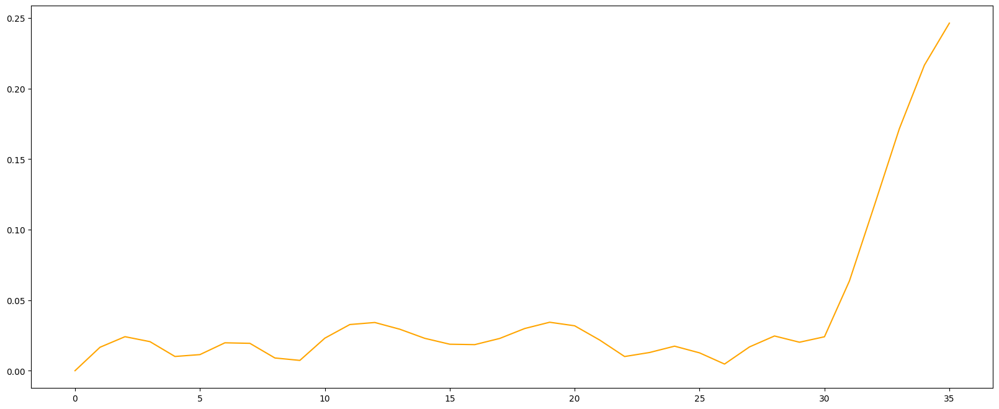

In [ ]:
plt.plot(errors[:,0], errors[:,1], color="orange")
plt.show()